In [1]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from transformers import get_linear_schedule_with_warmup
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, log_loss
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
import itertools

# For visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Import the necessary libraries
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier


In [2]:
# Load the dataset
df = pd.read_csv("./data/creditcard.csv")

# Describing the data
print("The dataframe can be described as:")
print(df.describe())

# Finding null values
print("The null-values within the dataframe are: ", df.isnull().sum())

# Finding NA values
print("The N/A values within the dataframe are: ", df.isna().sum())


The dataframe can be described as:
                Time            V1            V2            V3            V4  \
count  284807.000000  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean    94813.859575  1.168375e-15  3.416908e-16 -1.379537e-15  2.074095e-15   
std     47488.145955  1.958696e+00  1.651309e+00  1.516255e+00  1.415869e+00   
min         0.000000 -5.640751e+01 -7.271573e+01 -4.832559e+01 -5.683171e+00   
25%     54201.500000 -9.203734e-01 -5.985499e-01 -8.903648e-01 -8.486401e-01   
50%     84692.000000  1.810880e-02  6.548556e-02  1.798463e-01 -1.984653e-02   
75%    139320.500000  1.315642e+00  8.037239e-01  1.027196e+00  7.433413e-01   
max    172792.000000  2.454930e+00  2.205773e+01  9.382558e+00  1.687534e+01   

                 V5            V6            V7            V8            V9  \
count  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean   9.604066e-16  1.487313e-15 -5.556467e-16  1.213481e-16 -2.406331e-15   
std    

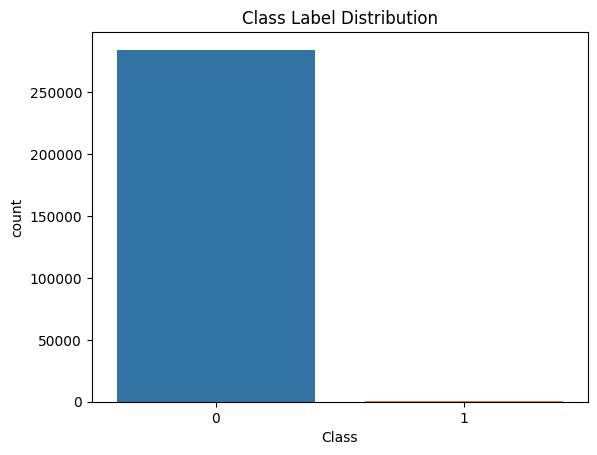

C:\Users\shehz\AppData\Local\Temp\ipykernel_3432\3066118919.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['Amount'], kde=False)


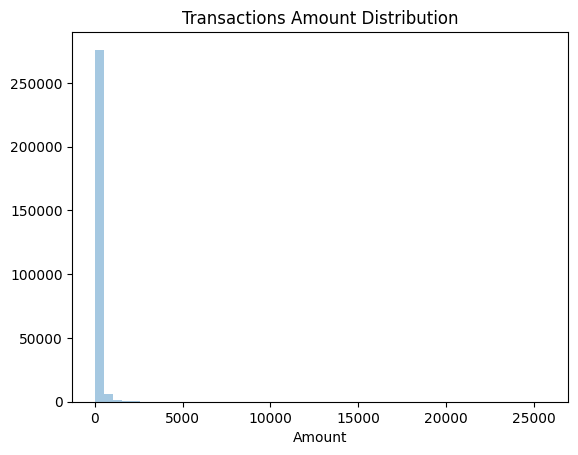

In [91]:
# Visualize the class label distribution
sns.countplot(x='Class', data=df)
plt.title("Class Label Distribution")
plt.show()

# Visualize the transactions amount distribution
sns.distplot(df['Amount'], kde=False)
plt.title("Transactions Amount Distribution")
plt.show()

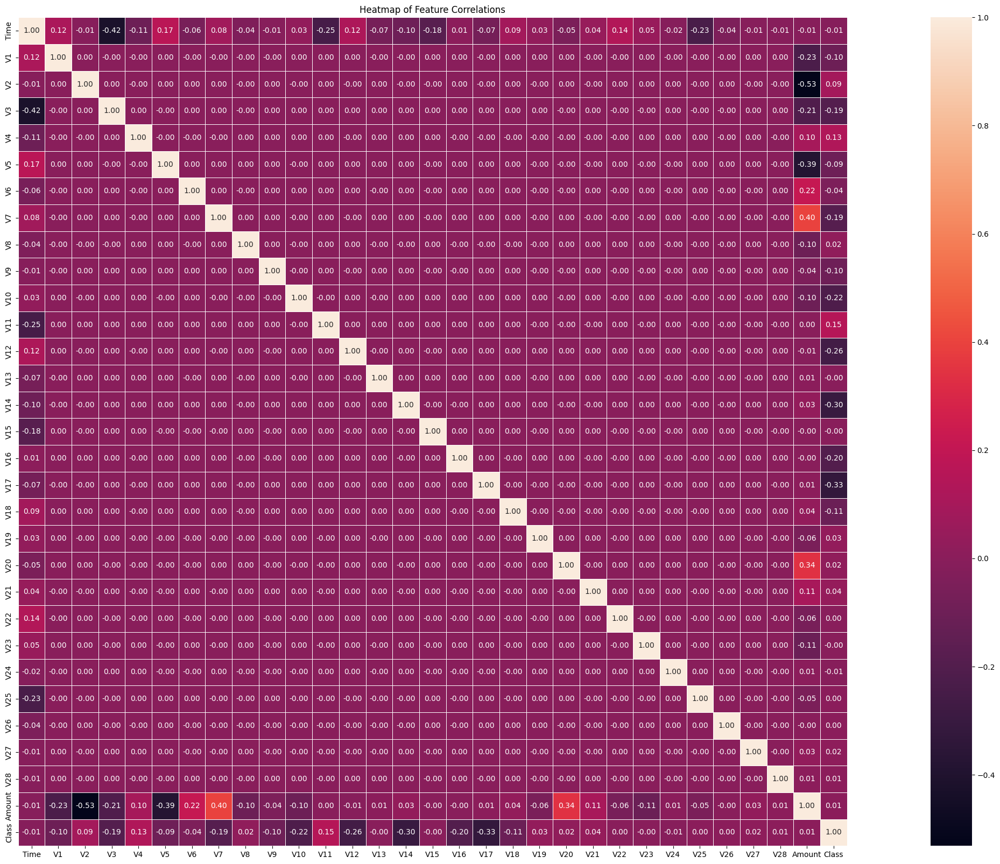

In [92]:
# Heatmap of Feature Correlations
plt.figure(figsize=(40, 20))
sns.heatmap(df.corr(), annot=True, cmap='rocket', square=True, fmt='.2f', linewidths=0.5)
plt.title("Heatmap of Feature Correlations")
plt.show()

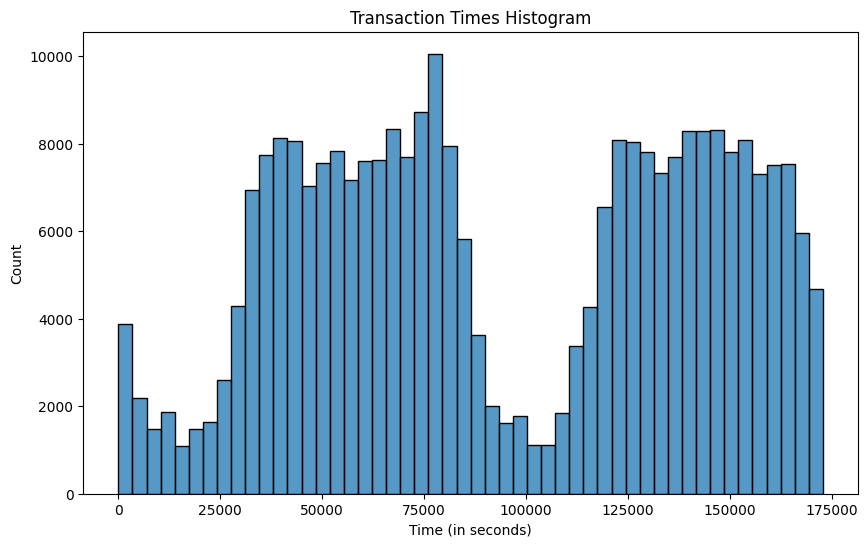

In [93]:
# Transaction times
plt.figure(figsize=(10, 6))
sns.histplot(df['Time'], bins=50, kde=False)
plt.title("Transaction Times Histogram")
plt.xlabel("Time (in seconds)")
plt.ylabel("Count")
plt.show()

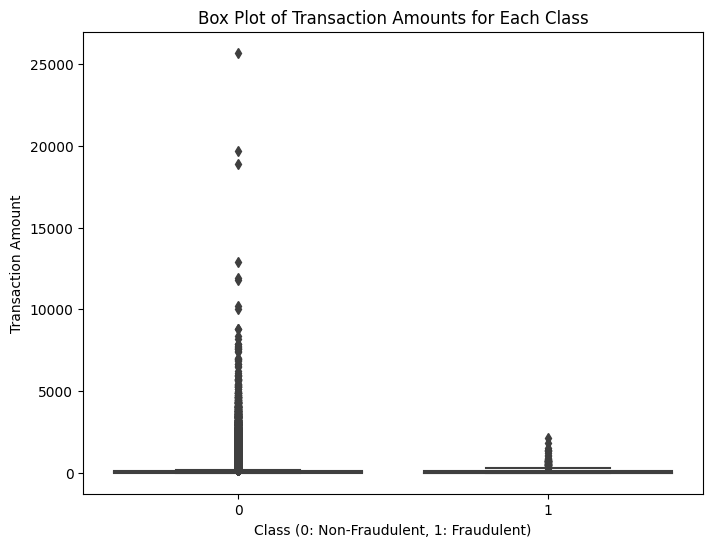

In [94]:
# Box plot of transaction amounts for each class
plt.figure(figsize=(8, 6))
sns.boxplot(x='Class', y='Amount', data=df)
plt.title("Box Plot of Transaction Amounts for Each Class")
plt.xlabel("Class (0: Non-Fraudulent, 1: Fraudulent)")
plt.ylabel("Transaction Amount")
plt.show()

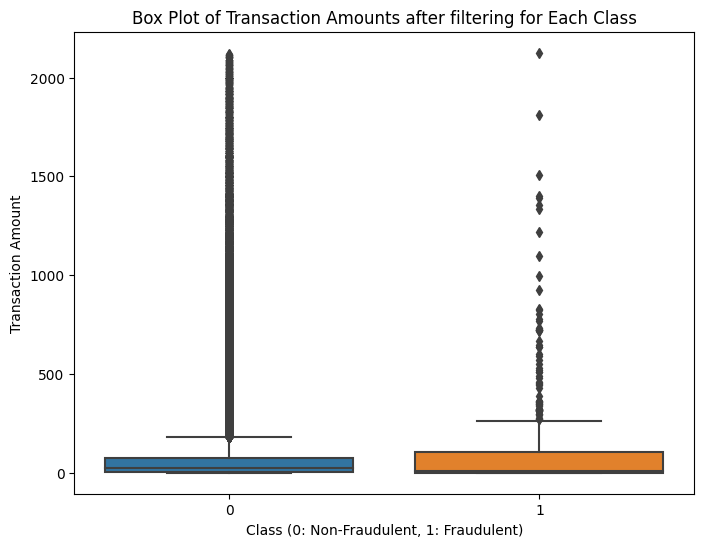

In [3]:
# Preprocessing steps

# From the boxplot above we can say that its best to remove non-fraudulent data wherein its amount exceed the
# maximum amount of fraudulent transactions
max_fraud_amount = df.loc[df['Class']==1,"Amount"].max()
df = df[df["Amount"]<=max_fraud_amount]

# Create a boxplot to confirm
plt.figure(figsize=(8, 6))
sns.boxplot(x='Class', y='Amount', data=df)
plt.title("Box Plot of Transaction Amounts after filtering for Each Class")
plt.xlabel("Class (0: Non-Fraudulent, 1: Fraudulent)")
plt.ylabel("Transaction Amount")
plt.show()

# Droppping the Time column
df = df.drop(["Time"], axis=1)

# Transforming the Amount column
scaler = StandardScaler()
df["Amount"] = scaler.fit_transform(df["Amount"].values.reshape(-1, 1))

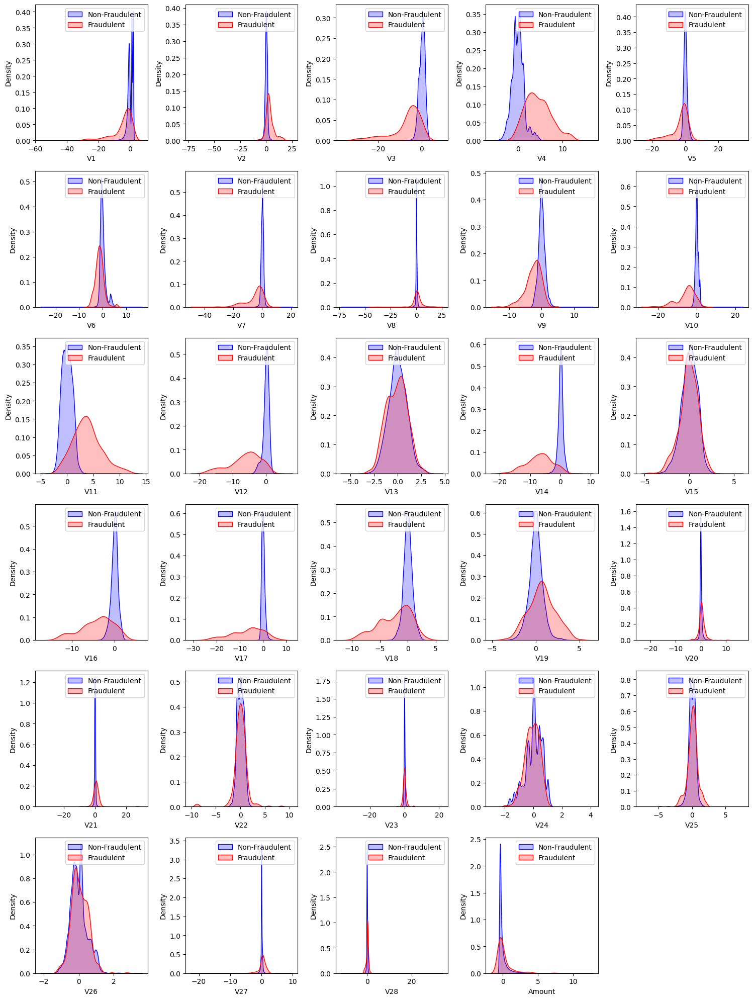

In [4]:
# Split data into features and labels
X = df.iloc[:, :-1].values
y = df.iloc[:, -1].values

# Feature distribution of each class
df_fraud = df[df['Class'] == 1]
df_non_fraud = df[df['Class'] == 0]

plt.figure(figsize=(15, 20))
for i, col in enumerate(df.columns[:-1], 1):
    plt.subplot(6, 5, i)
    sns.kdeplot(data=df_non_fraud, x=col, fill=True, color='blue', label='Non-Fraudulent')
    sns.kdeplot(data=df_fraud, x=col, fill=True, color='red', label='Fraudulent')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.legend()
plt.tight_layout()
plt.show()

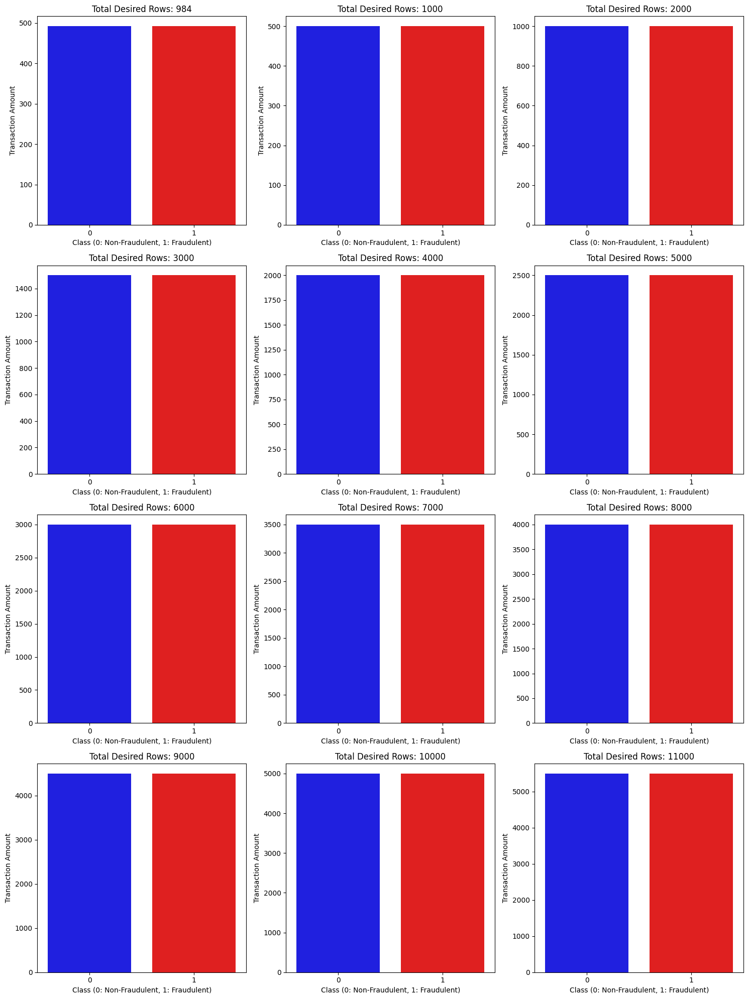

In [5]:
# Equalize the number of fraudulent and non-fraudulent transactions within the dataframe

minority_count = df[df['Class'] == 1].shape[0]
majority_count = df[df['Class'] == 0].shape[0]

total_desired_rows_list = [984, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000]
dataframes_dict = {}

n_plots = len(total_desired_rows_list)
n_cols = 3
n_rows = n_plots // n_cols + (n_plots % n_cols > 0)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 20))

for index, total_desired_rows in enumerate(total_desired_rows_list):
    desired_minority_count = total_desired_rows // 2
    desired_majority_count = total_desired_rows // 2

    smote = SMOTE(sampling_strategy={1: desired_minority_count})
    under = RandomUnderSampler(sampling_strategy={0: desired_majority_count})
    pipeline = Pipeline(steps=[('s', smote), ('u', under)])
    X_new, y_new = pipeline.fit_resample(X, y)

    column_names = df.columns[:-1]
    X_new_df = pd.DataFrame(X_new, columns=column_names)
    y_new_df = pd.DataFrame(y_new, columns=['Class'])
    df_new = pd.concat([X_new_df, y_new_df], axis=1)
    
    # Store the DataFrame in the dictionary
    dataframes_dict[total_desired_rows] = df_new

    # Create a boxplot to confirm equal distribution
    ax = axes[index // n_cols, index % n_cols]
    sns.countplot(x='Class', data=df_new, palette=['blue', 'red'], ax=ax)
    ax.set_title(f"Total Desired Rows: {total_desired_rows}")
    ax.set_xlabel("Class (0: Non-Fraudulent, 1: Fraudulent)")
    ax.set_ylabel("Transaction Amount")

for i in range(n_plots, n_rows * n_cols):
    fig.delaxes(axes[i // n_cols, i % n_cols])

plt.tight_layout()
plt.show()

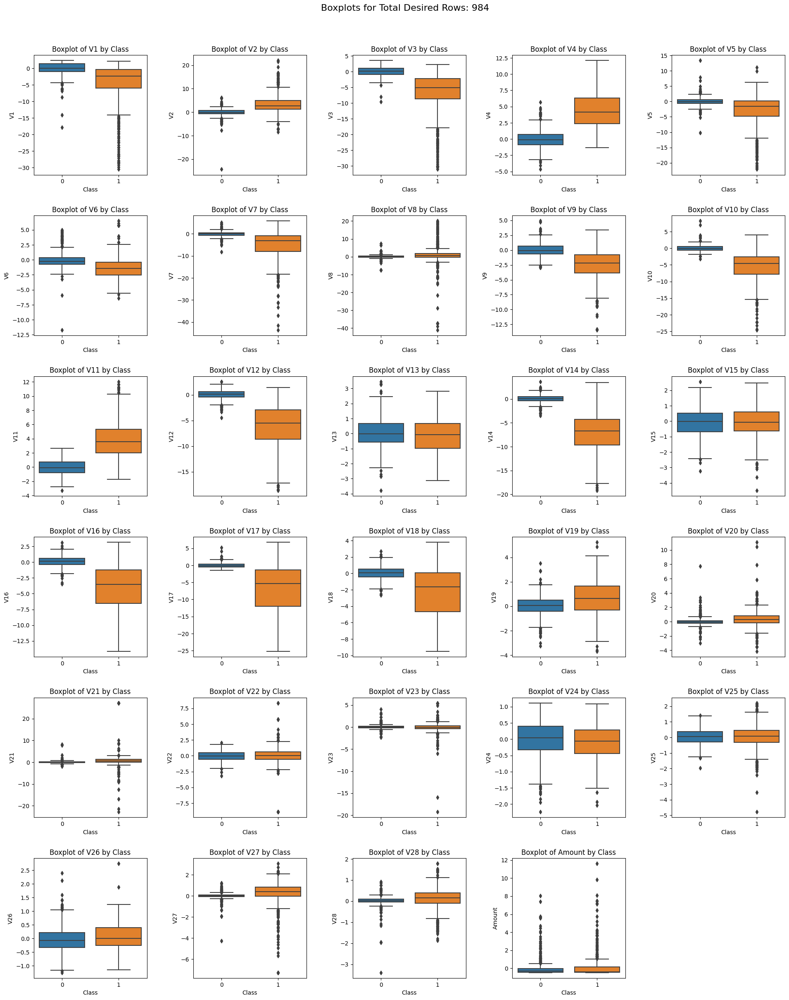

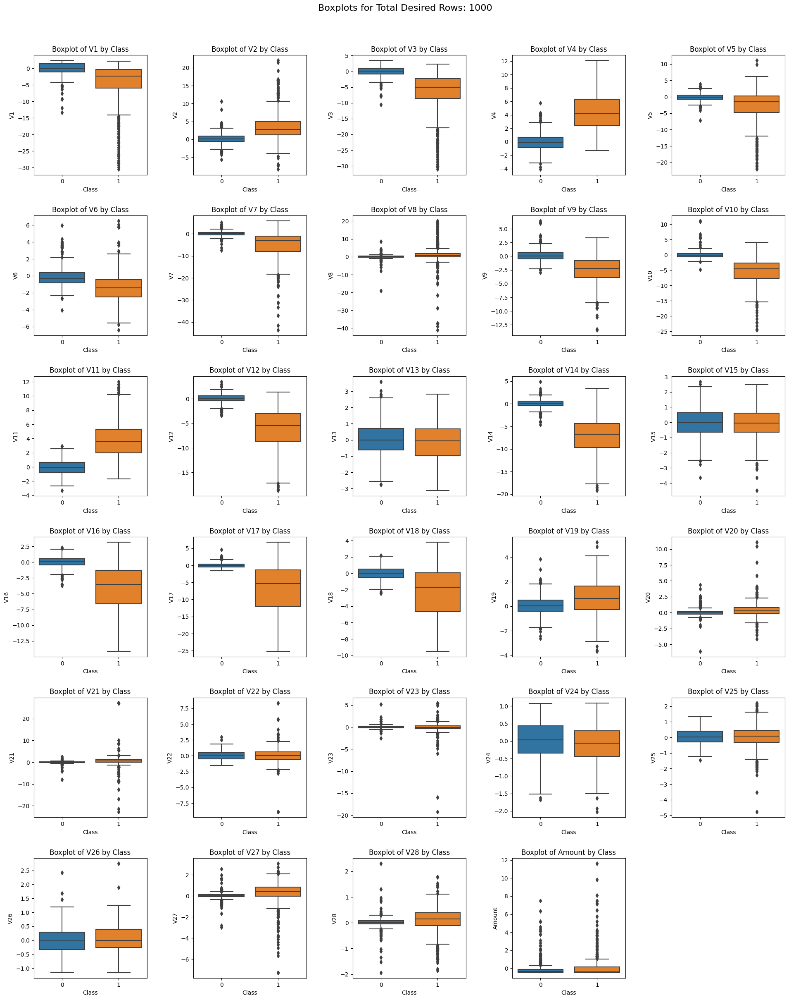

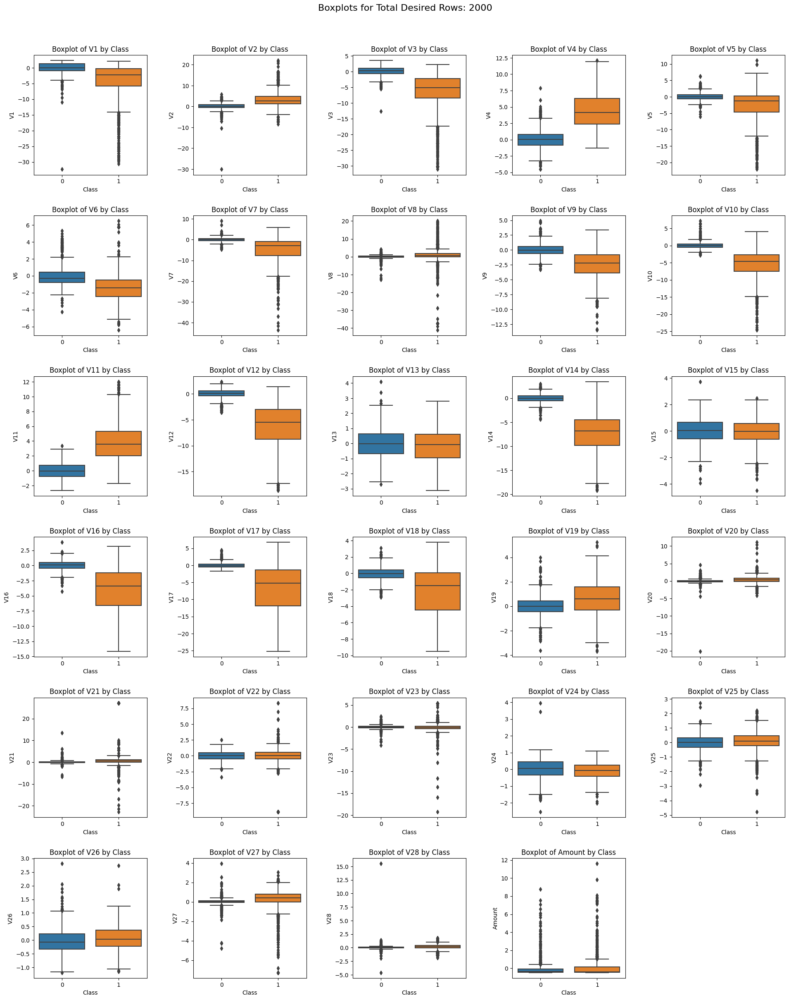

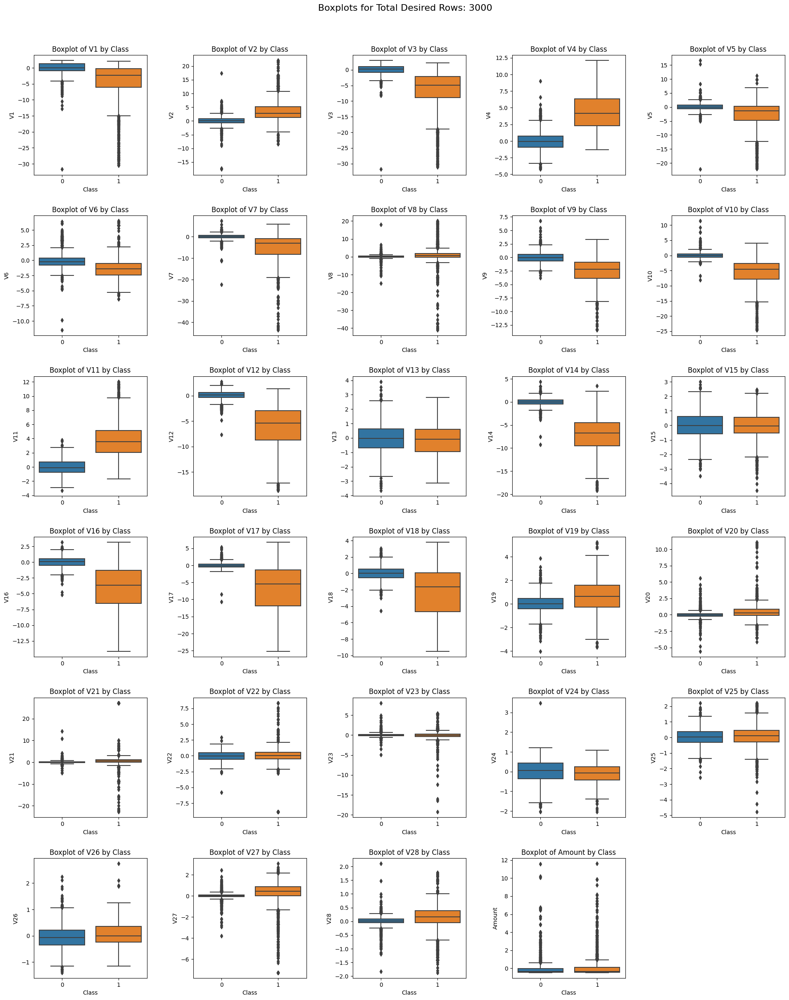

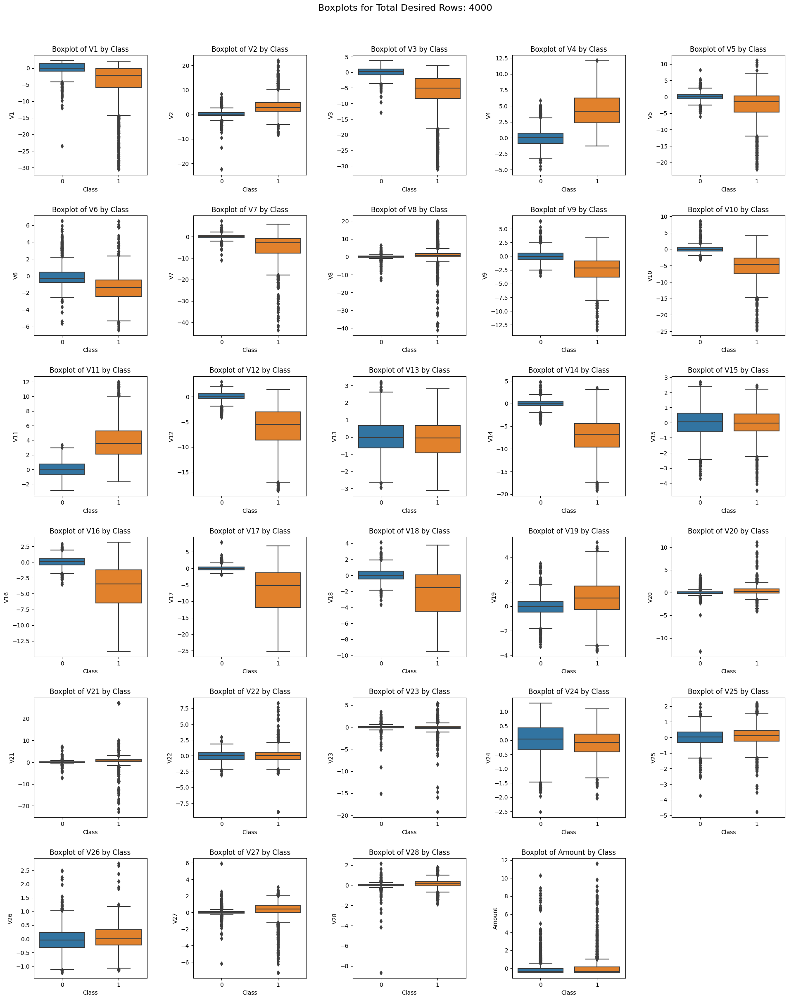

...

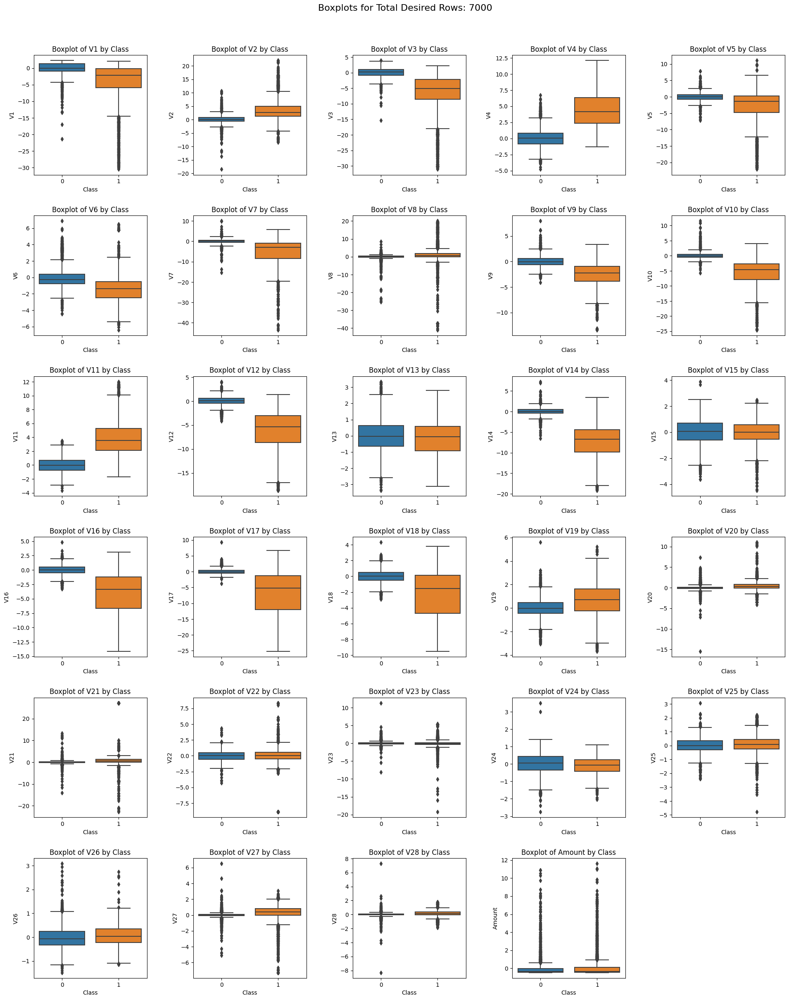

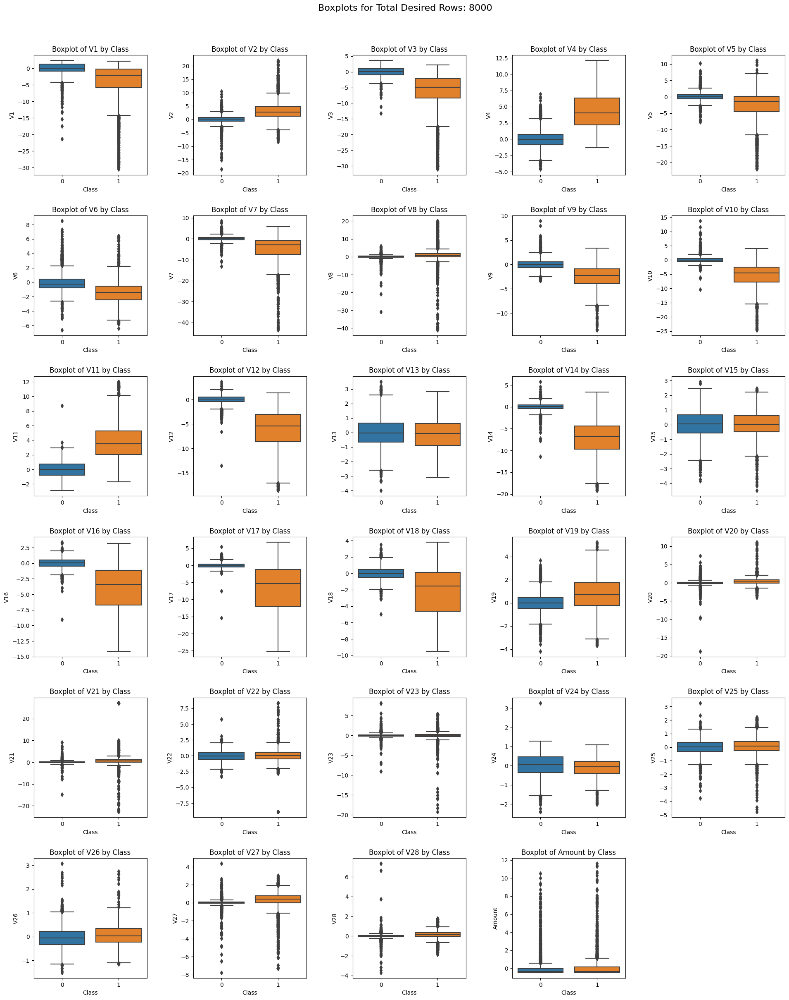

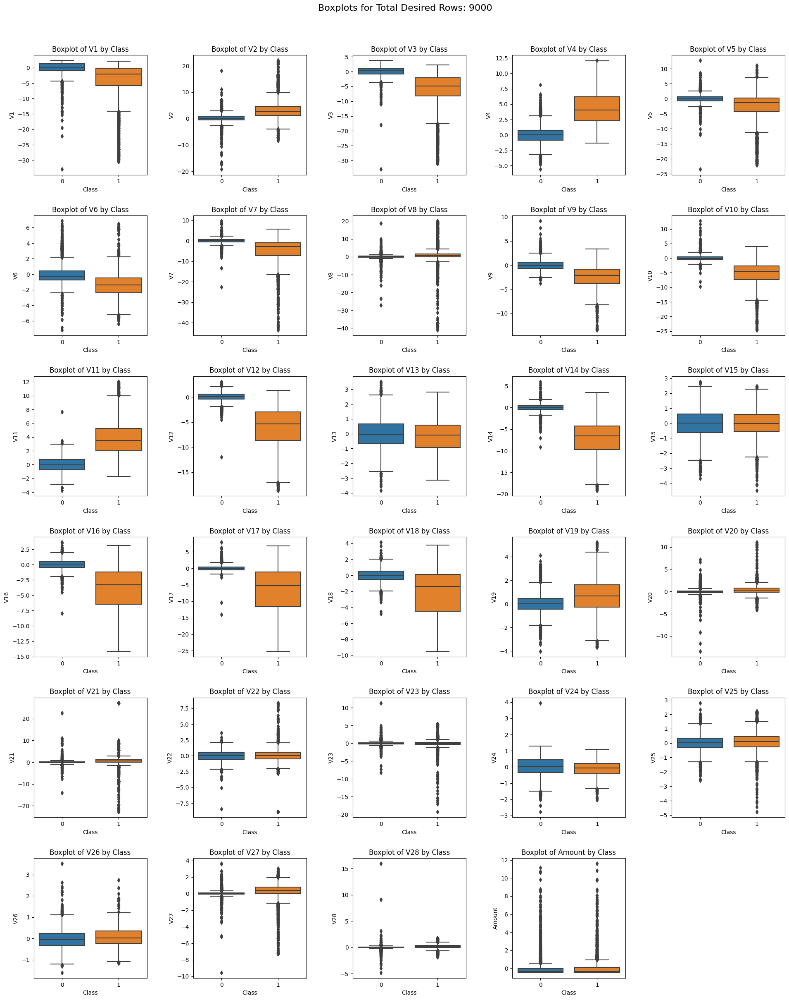

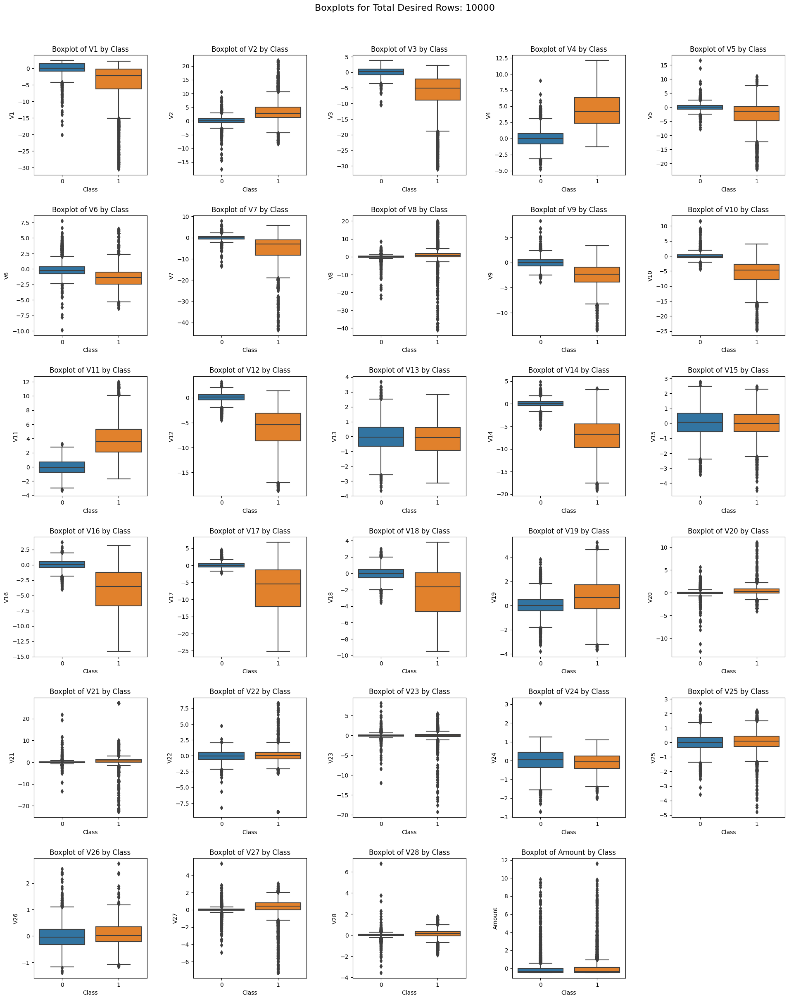

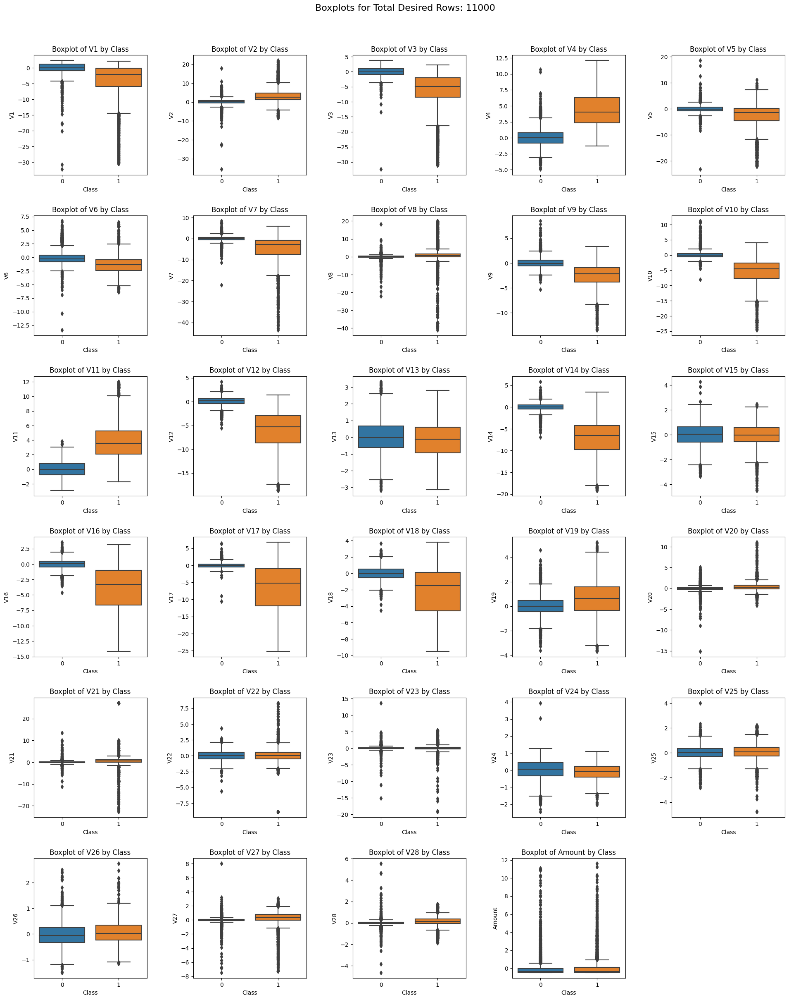

In [98]:
# Calculating the rows and columns for grid subplots.
import math

for total_desired_rows in total_desired_rows_list:

    df_new = dataframes_dict[total_desired_rows]

    # Calculate the number of rows and columns for the grid
    num_features = len(df_new.columns) - 1
    num_cols = 5
    num_rows = math.ceil(num_features / num_cols)

    # Create the grid of subplots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 4))
    fig.tight_layout(pad=5.0)
    fig.suptitle(f"Boxplots for Total Desired Rows: {total_desired_rows}", fontsize=16, y=1.02)

    # Boxplot distribution for fraudulent and non-fraudulent transactions for each feature
    for idx, column in enumerate(df_new.columns[:-1]):
        row = idx // num_cols
        col = idx % num_cols
        sns.boxplot(x="Class", y=column, data=df_new, ax=axes[row, col])
        axes[row, col].set_title(f"Boxplot of {column} by Class")

    for idx in range(num_features, num_rows * num_cols):
        row = idx // num_cols
        col = idx % num_cols
        axes[row, col].axis("off")
    
    plt.show()

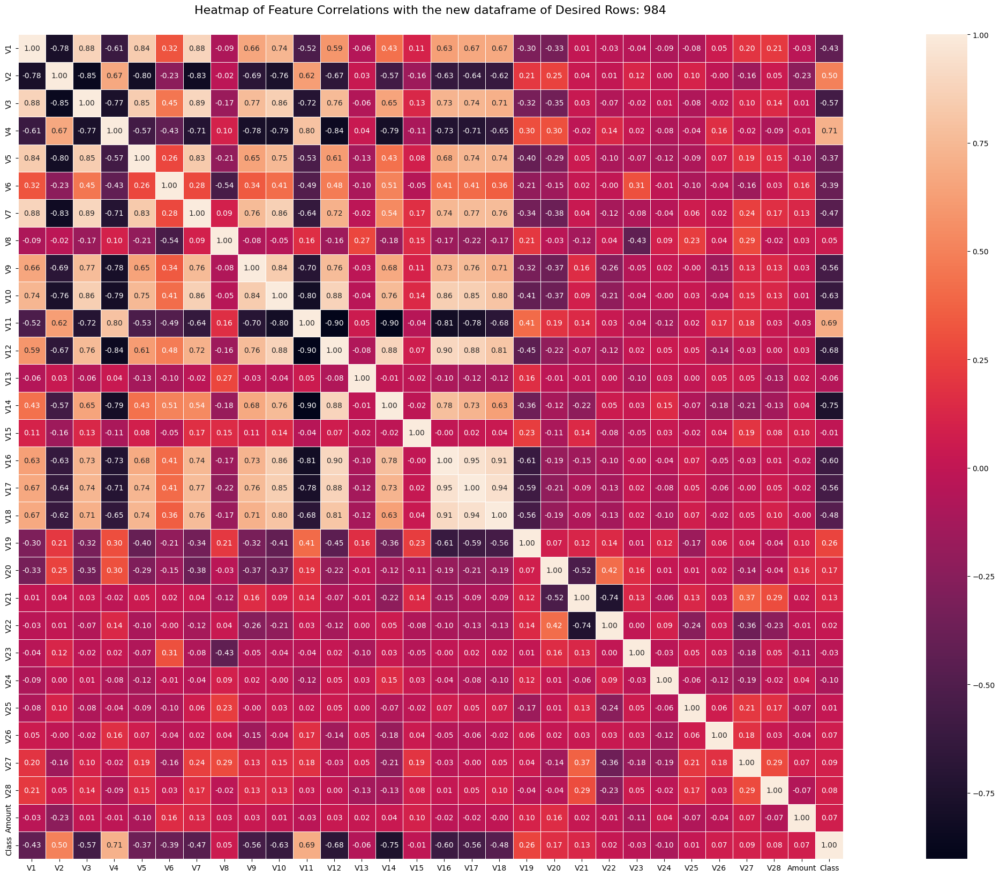

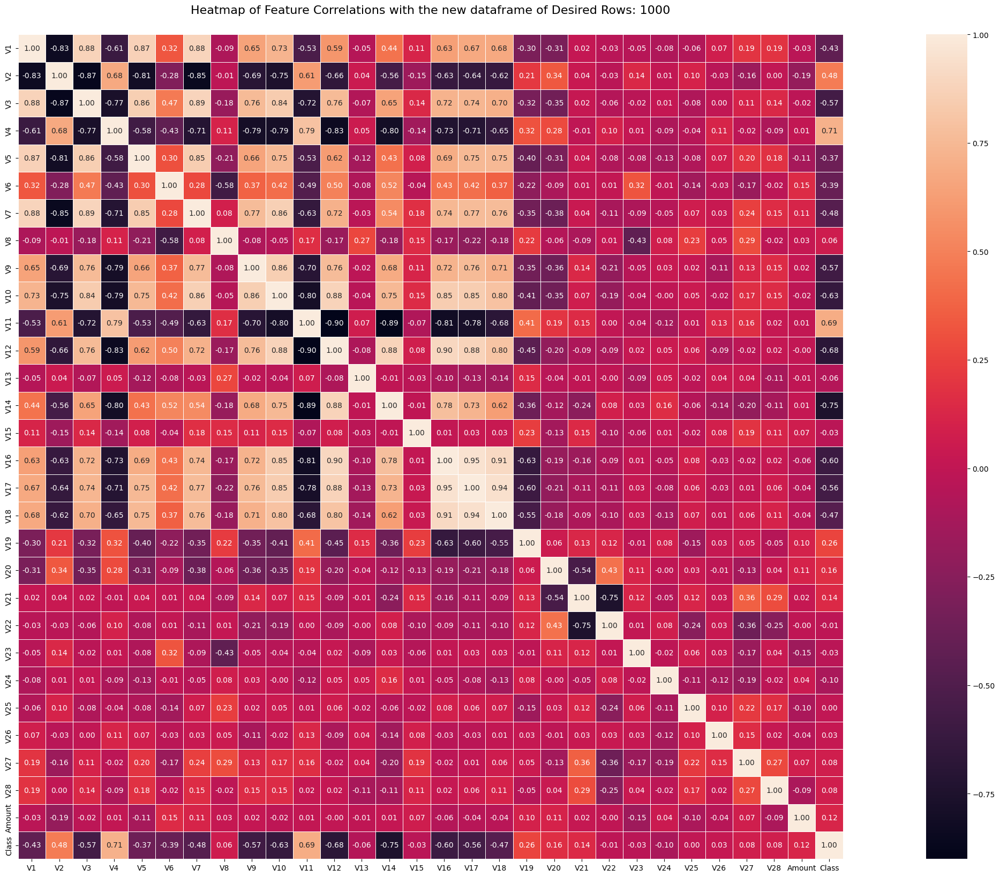

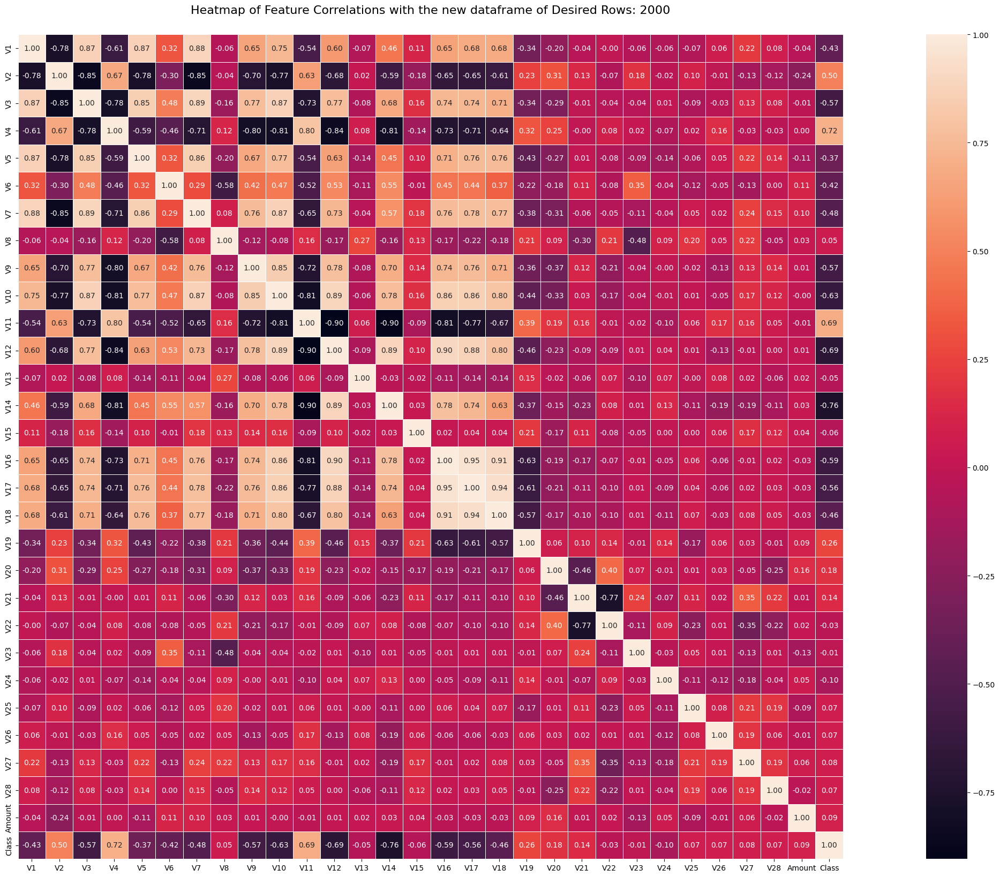

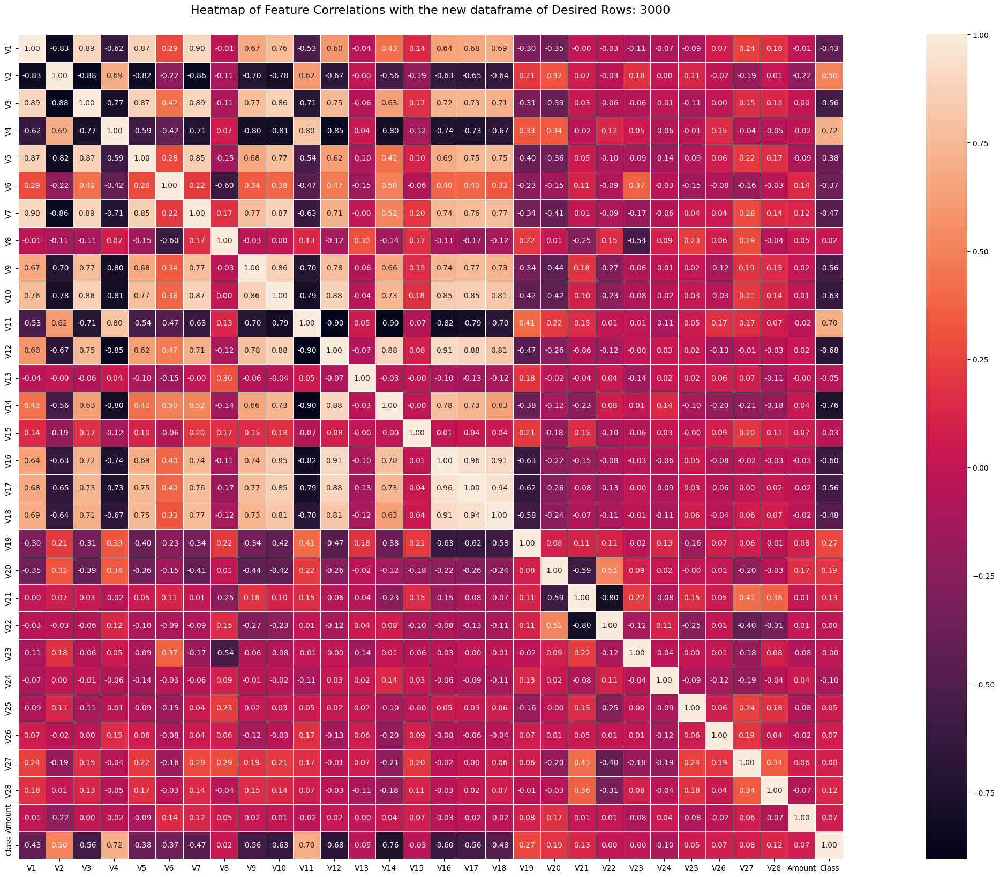

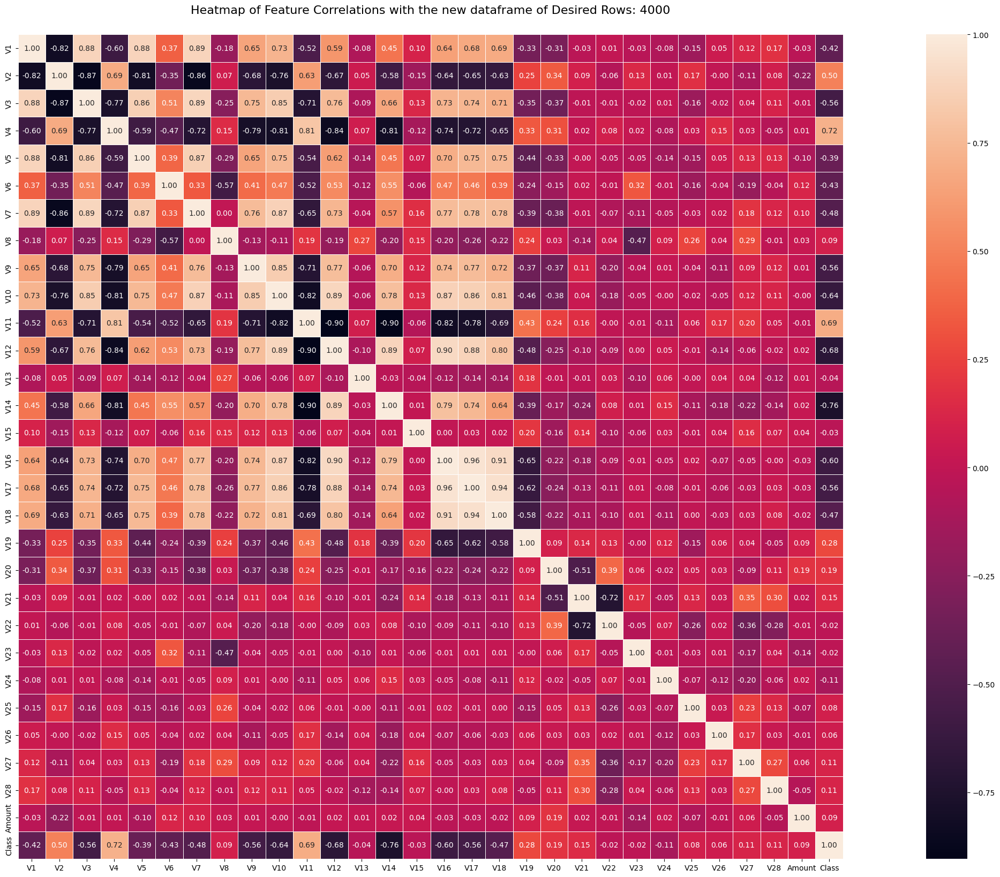

...

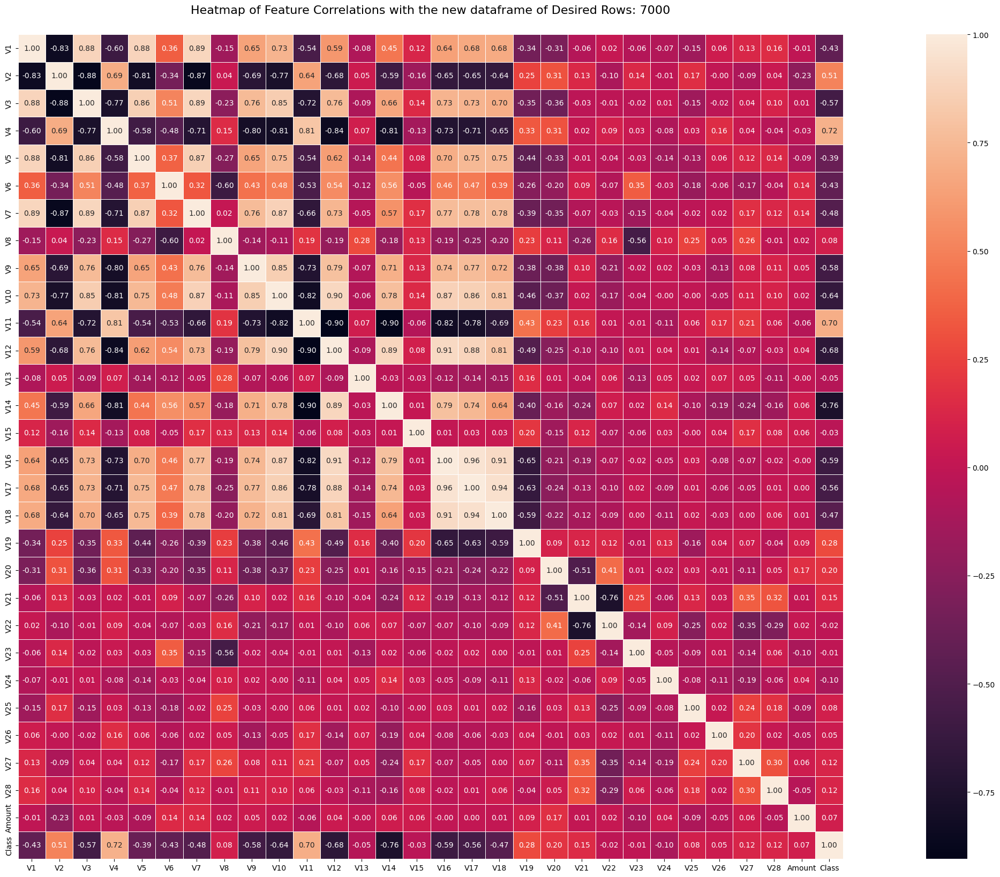

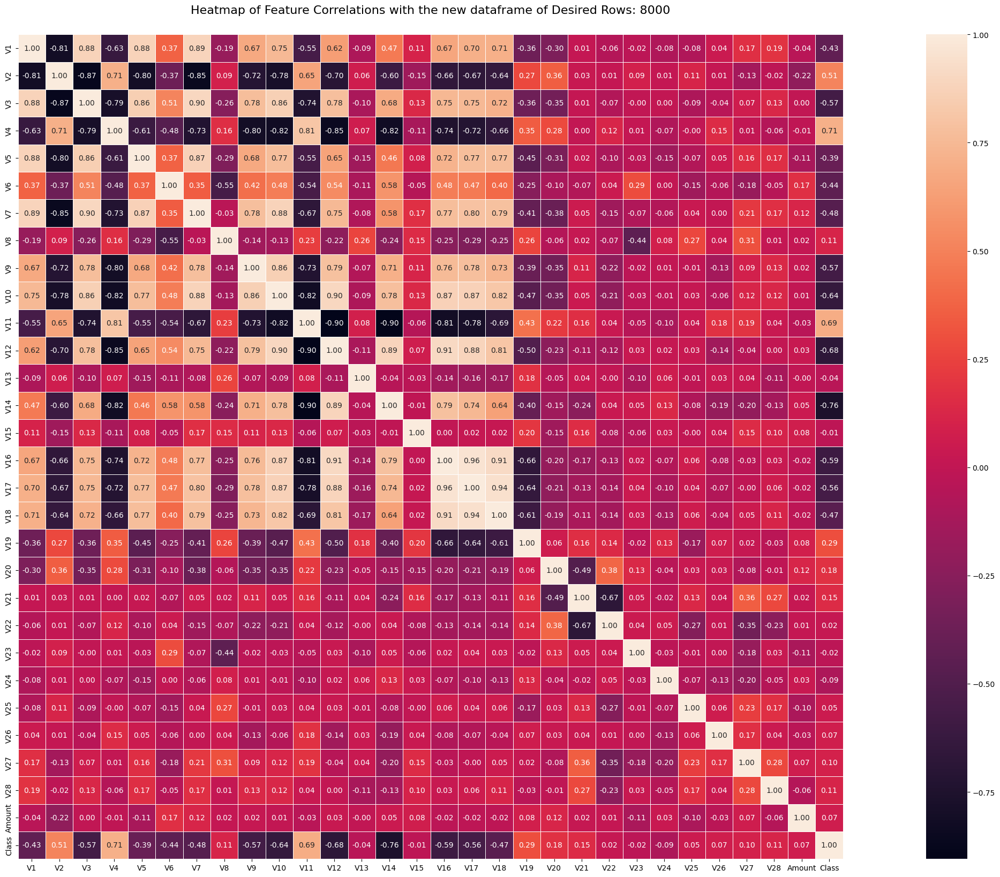

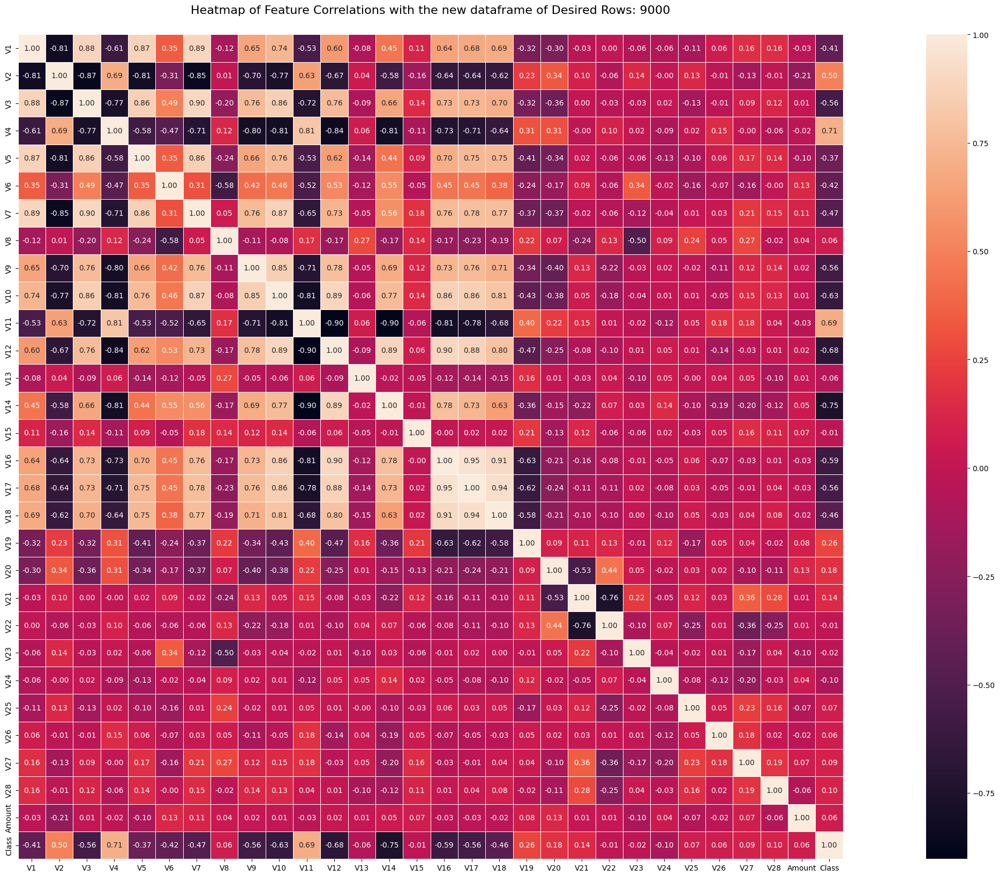

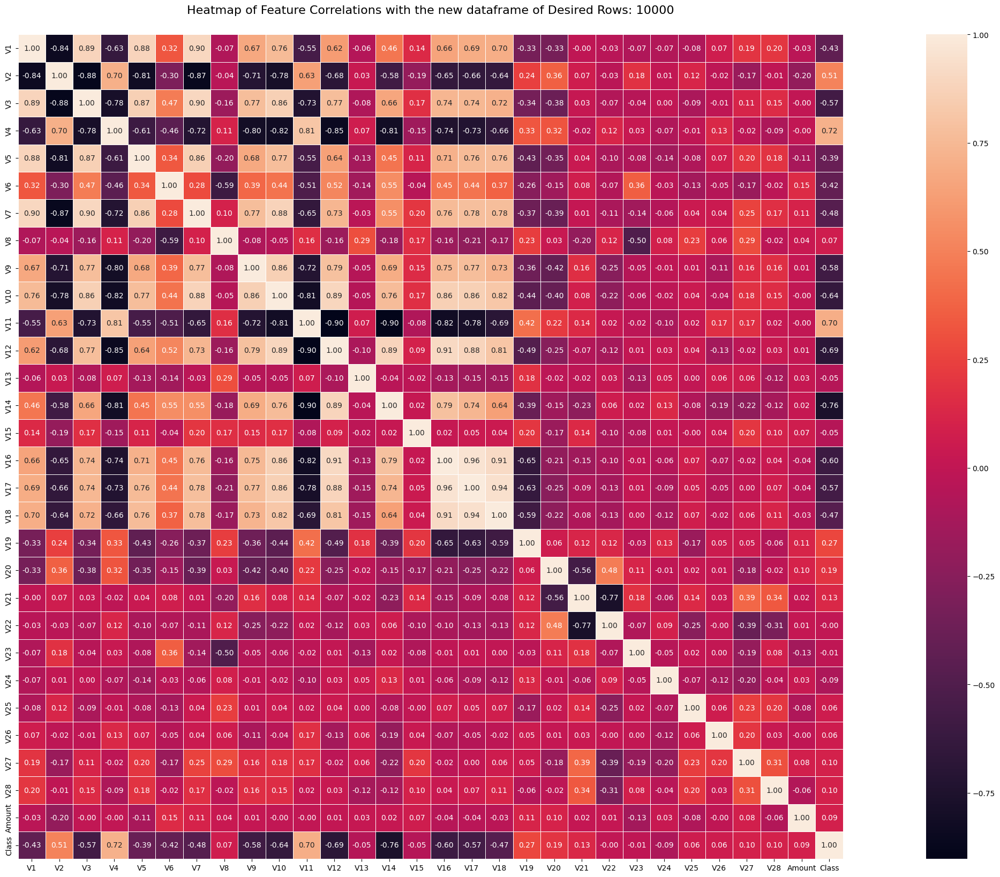

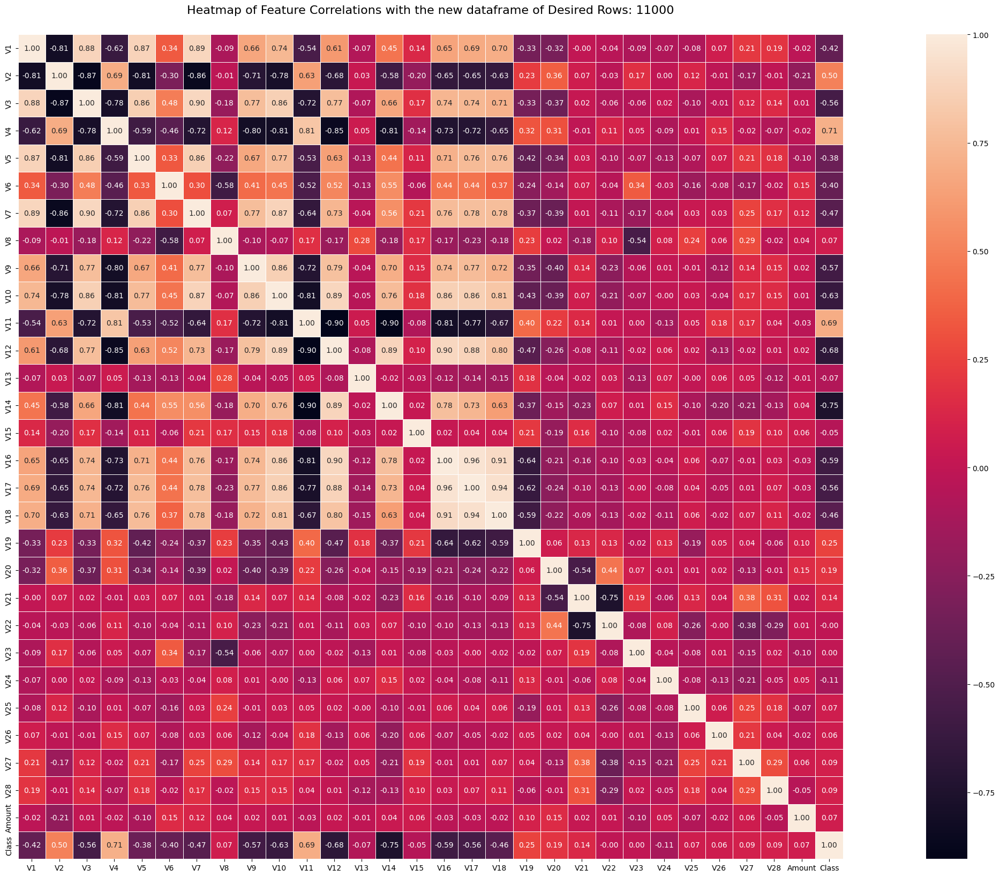

In [99]:
for index, total_desired_rows in enumerate(total_desired_rows_list):

    df_new = dataframes_dict[total_desired_rows]    

    # Heatmap of Feature Correlations with the new dataframes
    plt.figure(figsize=(40, 20))
    sns.heatmap(df_new.corr(), annot=True, cmap='rocket', square=True, fmt='.2f', linewidths=0.5)
    plt.title(f"Heatmap of Feature Correlations with the new dataframe of Desired Rows: {total_desired_rows}", fontsize=16, y=1.02)
    plt.show()

In [100]:
# Adding Logistic-Regression, KNN, Decision Tree, Naive Bayes and Random Forest classifiers
classifiers = {
    "Logistic Regression": LogisticRegression(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Naive Bayes": GaussianNB()
}

# Create a Multiple attention layer
class Multi_Attention(nn.Module):
    def __init__(self, samp_model, num_heads):
        super(Multi_Attention, self).__init__()
        assert samp_model % num_heads == 0

        self.samp_model = samp_model
        self.num_heads = num_heads
        self.count = samp_model // num_heads

        self.Wq = nn.Linear(samp_model, samp_model)
        self.Wk = nn.Linear(samp_model, samp_model)
        self.Wv = nn.Linear(samp_model, samp_model)
        self.Wo = nn.Linear(samp_model, samp_model)

    def forward(self, x):
        Q = self.Wq(x)
        K = self.Wk(x)
        V = self.Wv(x)
        Q, K, V = self.split_heads(Q, K, V)

        # Scaled dot-product attention
        scores = torch.matmul(Q, K.transpose(-2, -1)) / np.sqrt(self.count)
        attention_weights = torch.softmax(scores, dim=-1)
        attended_values = torch.matmul(attention_weights, V)
        attended_values = self.combine_heads(attended_values)

        return self.Wo(attended_values).squeeze(1)

    def split_heads(self, Q, K, V):
        batch_size = Q.size(0)
        Q = Q.view(batch_size, -1, self.num_heads, self.count).transpose(1, 2)
        K = K.view(batch_size, -1, self.num_heads, self.count).transpose(1, 2)
        V = V.view(batch_size, -1, self.num_heads, self.count).transpose(1, 2)
        return Q, K, V

    def combine_heads(self, attended_values):
        batch_size = attended_values.size(0)
        return attended_values.transpose(1, 2).contiguous().view(batch_size, -1, self.samp_model)

# Create the model with attention mechanism
class CreditCardFraudModel(nn.Module):
    def __init__(self, input_size, dropout_prob=0.5):
        super(CreditCardFraudModel, self).__init__()

        self.layer1 = nn.Sequential(
            nn.Linear(input_size, 128),
            nn.ReLU(),
            nn.Dropout(dropout_prob),
            nn.BatchNorm1d(128)
        )

        self.multi_attention = Multi_Attention(128, 2)
        self.layer2 = nn.Sequential(
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(dropout_prob),
            nn.BatchNorm1d(64)
        )

        self.layer3 = nn.Sequential(
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(dropout_prob),
            nn.BatchNorm1d(32),
        )
        self.output_layer = nn.Linear(32, 1)

    def forward(self, x):
        x = self.layer1(x)
        x = self.multi_attention(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.output_layer(x)
        return torch.sigmoid(x)

# Create the model with attention, LSTM and GRU as well
class CreditCardFraudModel_lstmgru(nn.Module):
    def __init__(self, input_size, dropout_prob=0.5):
        super(CreditCardFraudModel_lstmgru, self).__init__()

        self.layer1 = nn.Sequential(
            nn.Linear(input_size, 128),
            nn.ReLU(),
            nn.Dropout(dropout_prob),
            nn.BatchNorm1d(128)
        )

        self.multi_attention = Multi_Attention(128, 2)

        self.lstm = nn.LSTM(128, 64, batch_first=True)
        self.gru = nn.GRU(64, 32, batch_first=True)

        self.layer2 = nn.Sequential(
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Dropout(dropout_prob),
            nn.BatchNorm1d(16)
        )

        self.output_layer = nn.Linear(16, 1)

    def forward(self, x):
        x = self.layer1(x)
        x = self.multi_attention(x)
        
        x = x.unsqueeze(1)
        x, _ = self.lstm(x)
        x, _ = self.gru(x)
        x = x.squeeze(1)

        x = self.layer2(x)
        x = self.output_layer(x)
        return torch.sigmoid(x)

# Plotting confusion matrix
def plot_confusion_matrix(ax, conf_mat, split, name, total_desired_rows):
    im = ax.imshow(conf_mat, interpolation='nearest', cmap=plt.cm.Blues)
    ax.set_title(f'{name} (Split {split})')
    tick_marks = np.arange(2)
    ax.set_xticks(tick_marks)
    ax.set_xticklabels(['Non-Fraud', 'Fraud'], rotation=45)
    ax.set_yticks(tick_marks)
    ax.set_yticklabels(['Non-Fraud', 'Fraud'])
    thresh = conf_mat.max() / 2.
    for i, j in itertools.product(range(conf_mat.shape[0]), range(conf_mat.shape[1])):
        ax.text(j, i, format(conf_mat[i, j], 'd'), horizontalalignment="center", color="white" if conf_mat[i, j] > thresh else "black")
    ax.set_ylabel('True label')
    ax.set_xlabel('Predicted label')

# Train and evaluate the model
def train_and_evaluate(model, train_loader, test_loader, num_epochs, optimizer, scheduler, criterion, device):
    model.train()

    for epoch in range(num_epochs):
        running_loss_avg = 0.0
        alpha = 0.1
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs.squeeze(), labels.float())
            loss.backward()
            optimizer.step()

            if scheduler:
                scheduler.step()

            running_loss_avg = alpha * loss.item() + (1 - alpha) * running_loss_avg

        # print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss / len(train_loader):.4f}")

    model.eval()
    y_pred, y_true = [], []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            y_pred.extend(outputs.squeeze().tolist())
            y_true.extend(labels.tolist())

    y_pred = np.array(y_pred)
    y_pred_labels = (y_pred >= 0.5).astype(int)

    # This is for accuracy
    correct = np.sum(y_true == y_pred_labels)
    total = len(y_true)
    accuracy = correct / total

    precision = precision_score(y_true, y_pred_labels)
    recall = recall_score(y_true, y_pred_labels)
    f1 = f1_score(y_true, y_pred_labels)
    roc_auc = roc_auc_score(y_true, y_pred)
    
    conf_mat = confusion_matrix(y_true, y_pred_labels)

    return precision, recall, f1, roc_auc, accuracy, conf_mat, running_loss_avg


In [101]:
# Creating X and y for all the dataframes
X_new_alldf = {}
Y_new_alldf = {}

for total_desired_rows in total_desired_rows_list:
    df_new = dataframes_dict[total_desired_rows]    
    X_new_alldf[total_desired_rows] = df_new.iloc[:, :-1].values
    Y_new_alldf[total_desired_rows] = df_new.iloc[:, -1].values

This is Split number: 1 for Total Desired Rows: 984


Logistic Regression:
Accuracy: 0.9188, Precision: 0.9556, Recall: 0.8776, F1-score: 0.9149, ROC-AUC: 0.9186

K-Nearest Neighbors:
Accuracy: 0.9188, Precision: 0.9556, Recall: 0.8776, F1-score: 0.9149, ROC-AUC: 0.9186

Decision Tree:
Accuracy: 0.8579, Precision: 0.8646, Recall: 0.8469, F1-score: 0.8557, ROC-AUC: 0.8578

Naive Bayes:
Accuracy: 0.9036, Precision: 0.9647, Recall: 0.8367, F1-score: 0.8962, ROC-AUC: 0.9032


***************************************************************************

For the FraudModel:
Accuracy: 0.9289, Precision: 0.9773, Recall: 0.8776, F1-score: 0.9247, ROC-AUC: 0.9705


For the FraudModel_lstmgru:
Accuracy: 0.9239, Precision: 0.9462, Recall: 0.8980, F1-score: 0.9215, ROC-AUC: 0.9707

***************************************************************************

This is Split number: 2 for Total Desired Rows: 984


Logistic Regression:
Accuracy: 0.9188, Precision: 0.9556, Recall: 0.8776, F1-score: 0.9149

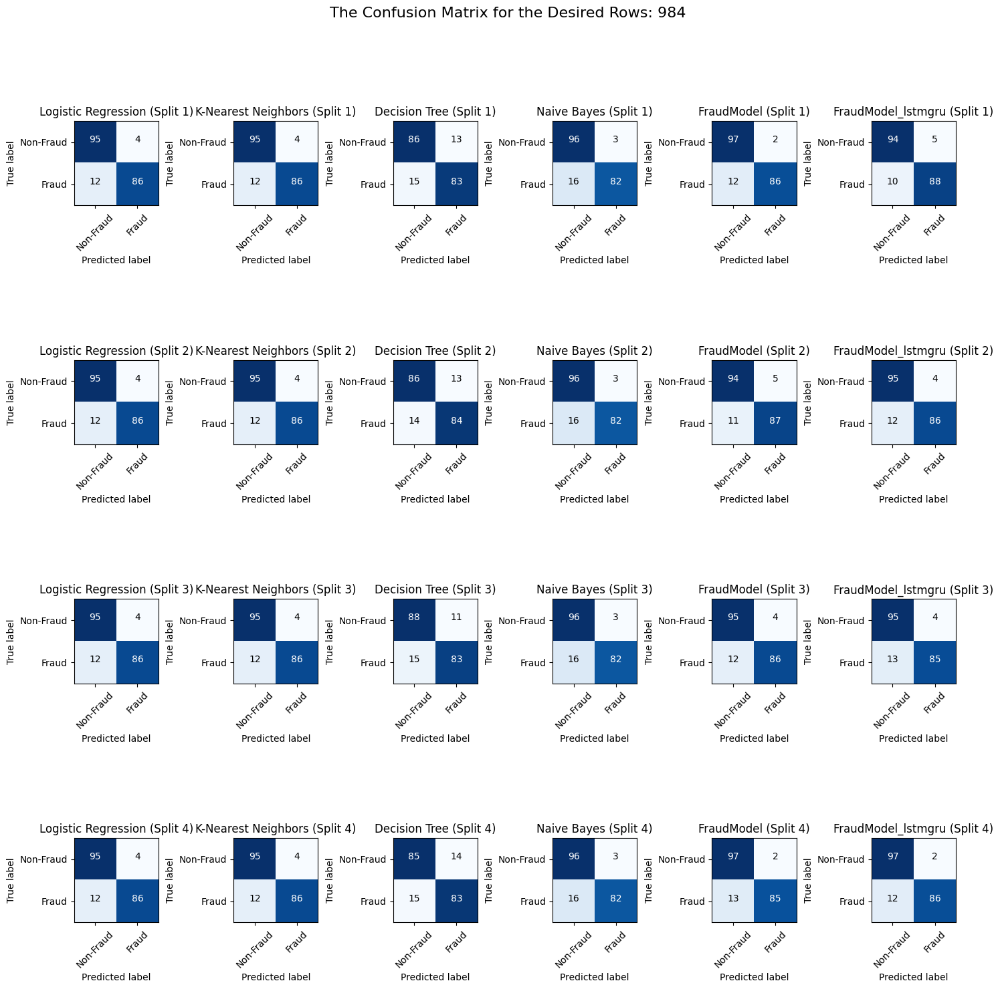

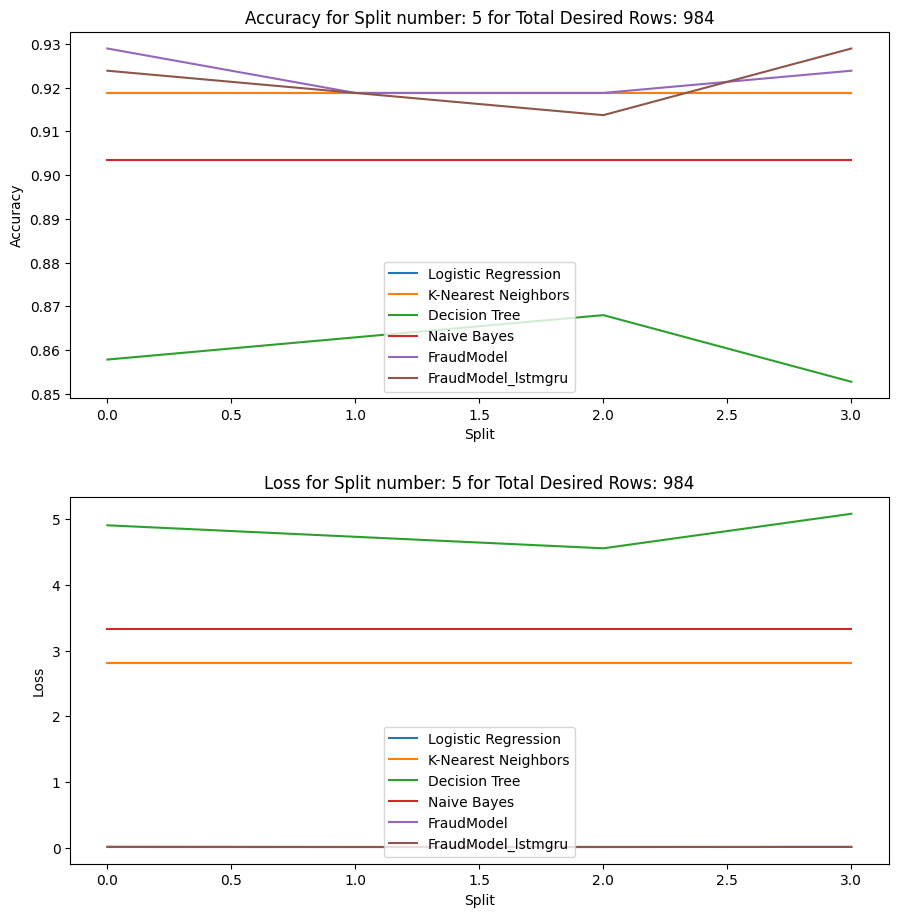

This is Split number: 1 for Total Desired Rows: 1000


Logistic Regression:
Accuracy: 0.9350, Precision: 0.9892, Recall: 0.8846, F1-score: 0.9340, ROC-AUC: 0.9371

K-Nearest Neighbors:
Accuracy: 0.9400, Precision: 1.0000, Recall: 0.8846, F1-score: 0.9388, ROC-AUC: 0.9423

Decision Tree:
Accuracy: 0.9100, Precision: 0.9388, Recall: 0.8846, F1-score: 0.9109, ROC-AUC: 0.9111

Naive Bayes:
Accuracy: 0.8750, Precision: 0.9247, Recall: 0.8269, F1-score: 0.8731, ROC-AUC: 0.8770


***************************************************************************

For the FraudModel:
Accuracy: 0.9350, Precision: 1.0000, Recall: 0.8750, F1-score: 0.9333, ROC-AUC: 0.9802


For the FraudModel_lstmgru:
Accuracy: 0.9400, Precision: 0.9894, Recall: 0.8942, F1-score: 0.9394, ROC-AUC: 0.9797

***************************************************************************

This is Split number: 2 for Total Desired Rows: 1000


Logistic Regression:
Accuracy: 0.9350, Precision: 0.9892, Recall: 0.8846, F1-score: 0.93

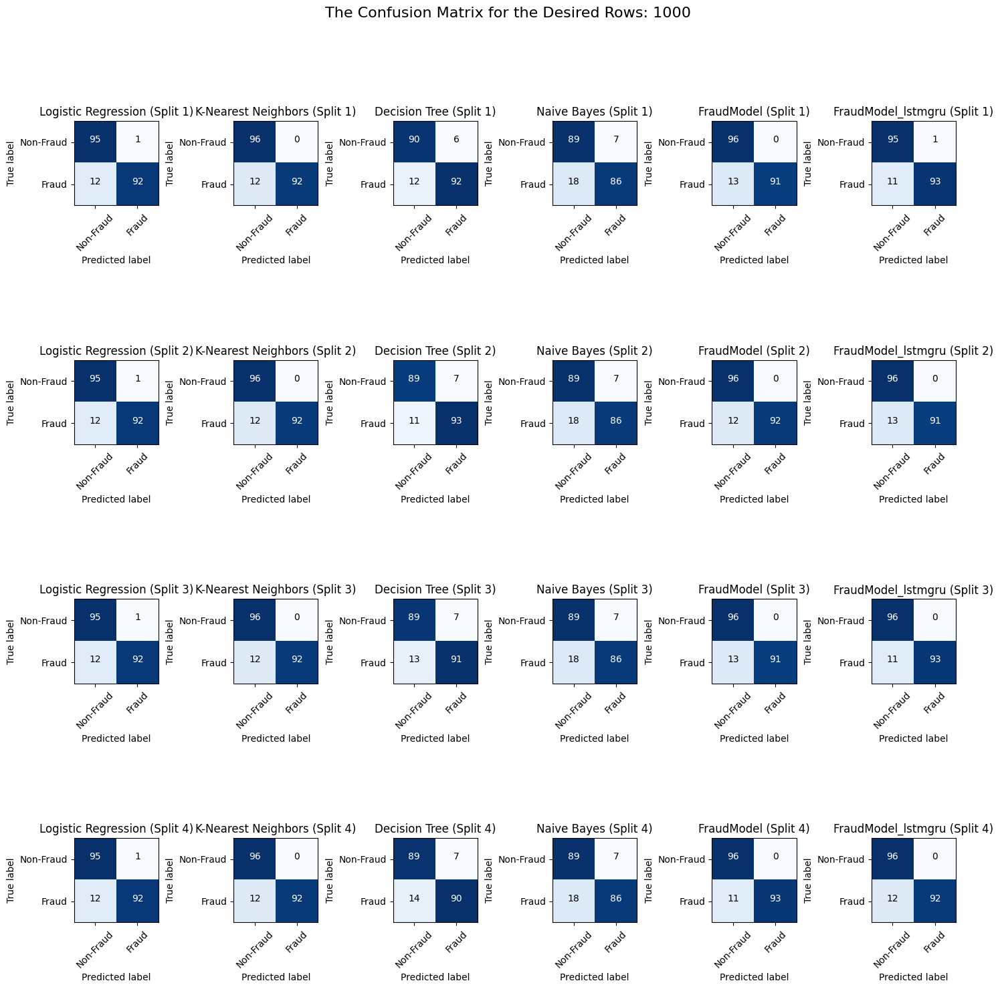

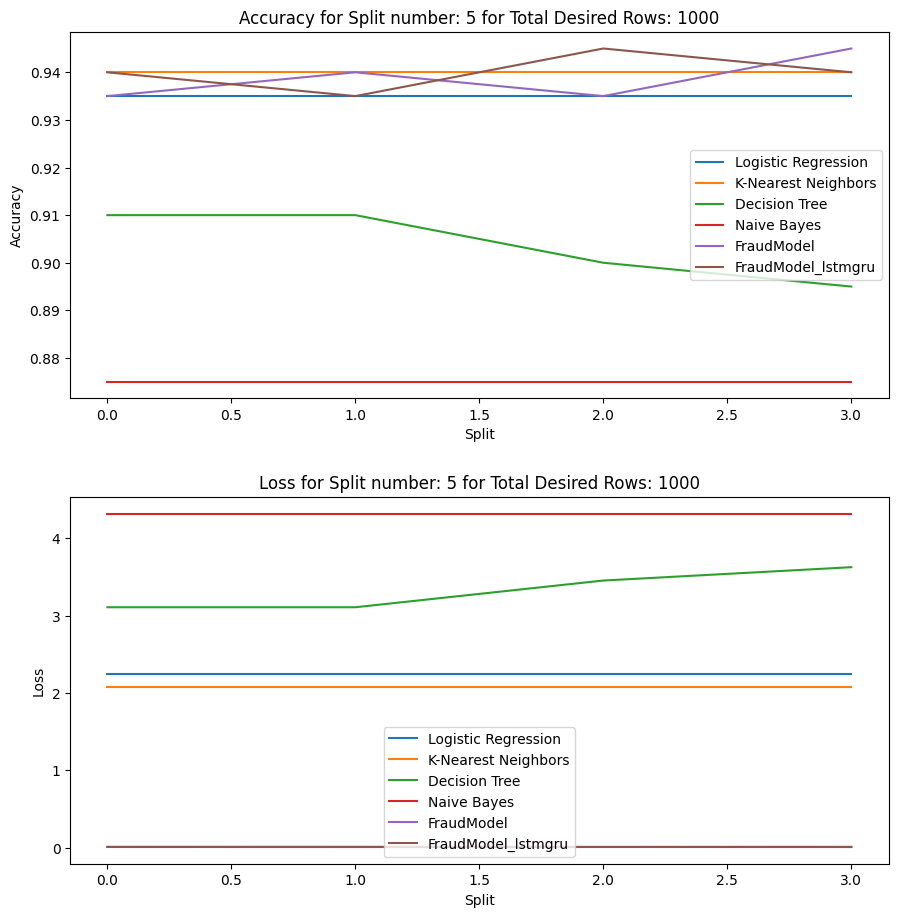

This is Split number: 1 for Total Desired Rows: 2000


Logistic Regression:
Accuracy: 0.9500, Precision: 0.9641, Recall: 0.9353, F1-score: 0.9495, ROC-AUC: 0.9501

K-Nearest Neighbors:
Accuracy: 0.9650, Precision: 0.9606, Recall: 0.9701, F1-score: 0.9653, ROC-AUC: 0.9650

Decision Tree:
Accuracy: 0.9350, Precision: 0.9227, Recall: 0.9502, F1-score: 0.9363, ROC-AUC: 0.9349

Naive Bayes:
Accuracy: 0.9225, Precision: 0.9521, Recall: 0.8905, F1-score: 0.9203, ROC-AUC: 0.9227


***************************************************************************

For the FraudModel:
Accuracy: 0.9700, Precision: 0.9797, Recall: 0.9602, F1-score: 0.9698, ROC-AUC: 0.9954


For the FraudModel_lstmgru:
Accuracy: 0.9725, Precision: 0.9703, Recall: 0.9751, F1-score: 0.9727, ROC-AUC: 0.9959

***************************************************************************

This is Split number: 2 for Total Desired Rows: 2000


Logistic Regression:
Accuracy: 0.9500, Precision: 0.9641, Recall: 0.9353, F1-score: 0.94

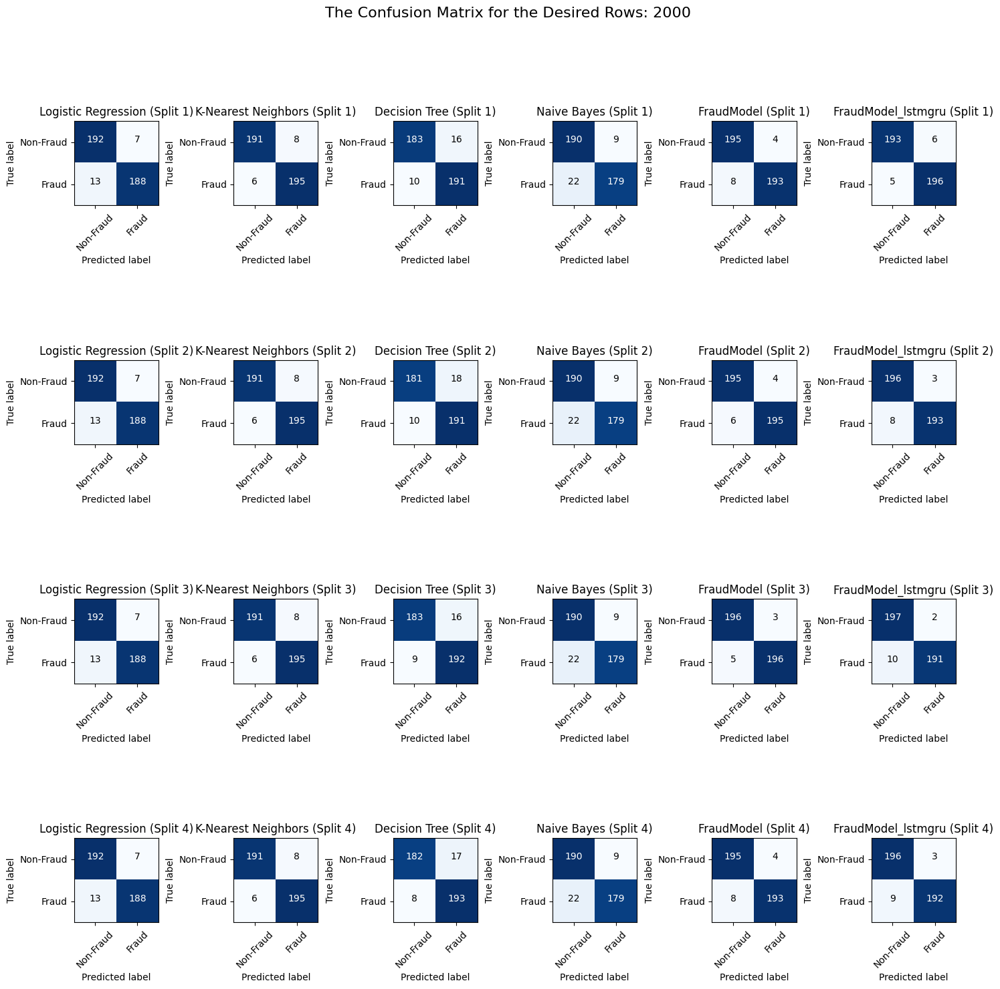

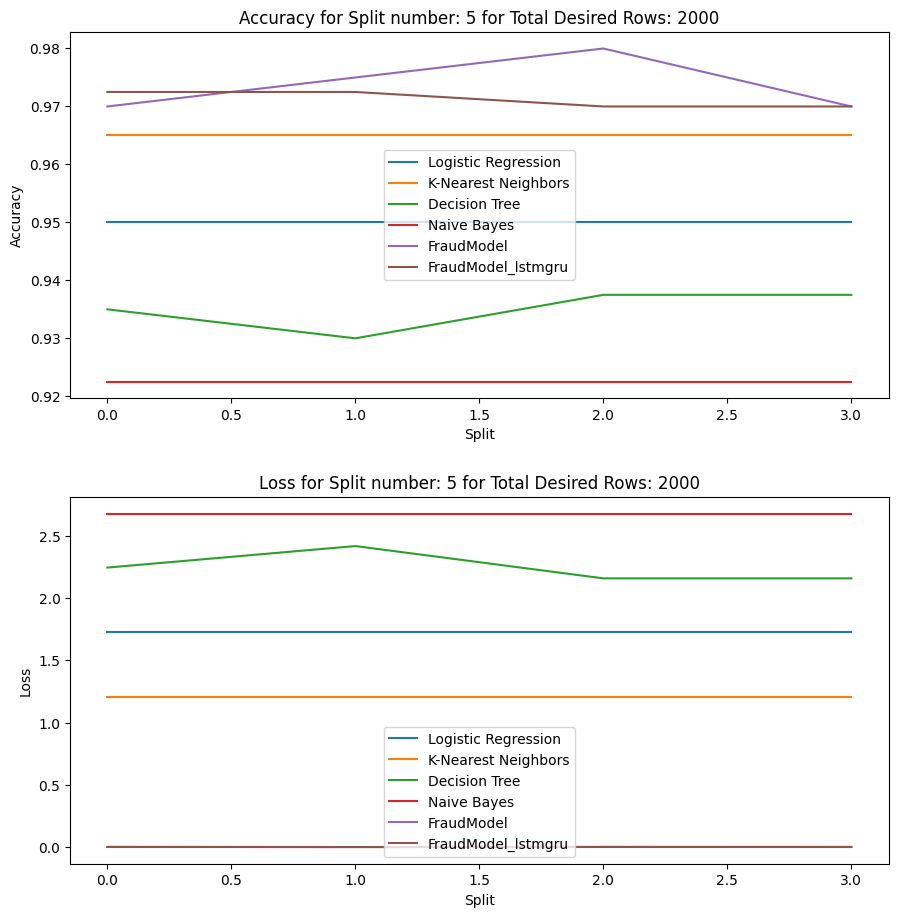

This is Split number: 1 for Total Desired Rows: 3000


Logistic Regression:
Accuracy: 0.9417, Precision: 0.9809, Recall: 0.8955, F1-score: 0.9362, ROC-AUC: 0.9397

K-Nearest Neighbors:
Accuracy: 0.9583, Precision: 0.9517, Recall: 0.9617, F1-score: 0.9567, ROC-AUC: 0.9585

Decision Tree:
Accuracy: 0.9233, Precision: 0.9030, Recall: 0.9408, F1-score: 0.9215, ROC-AUC: 0.9241

Naive Bayes:
Accuracy: 0.9050, Precision: 0.9713, Recall: 0.8258, F1-score: 0.8927, ROC-AUC: 0.9017


***************************************************************************

For the FraudModel:
Accuracy: 0.9533, Precision: 0.9709, Recall: 0.9303, F1-score: 0.9502, ROC-AUC: 0.9918


For the FraudModel_lstmgru:
Accuracy: 0.9433, Precision: 0.9847, Recall: 0.8955, F1-score: 0.9380, ROC-AUC: 0.9922

***************************************************************************

This is Split number: 2 for Total Desired Rows: 3000


Logistic Regression:
Accuracy: 0.9417, Precision: 0.9809, Recall: 0.8955, F1-score: 0.93

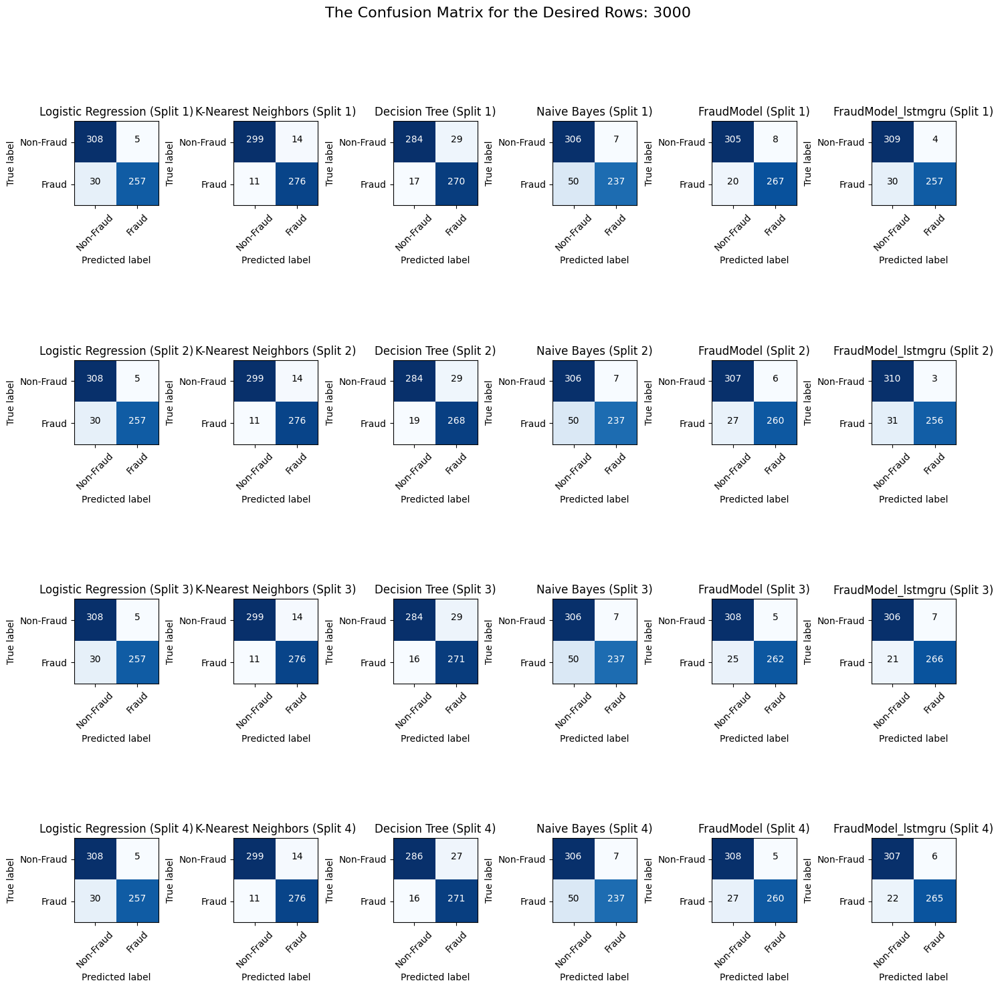

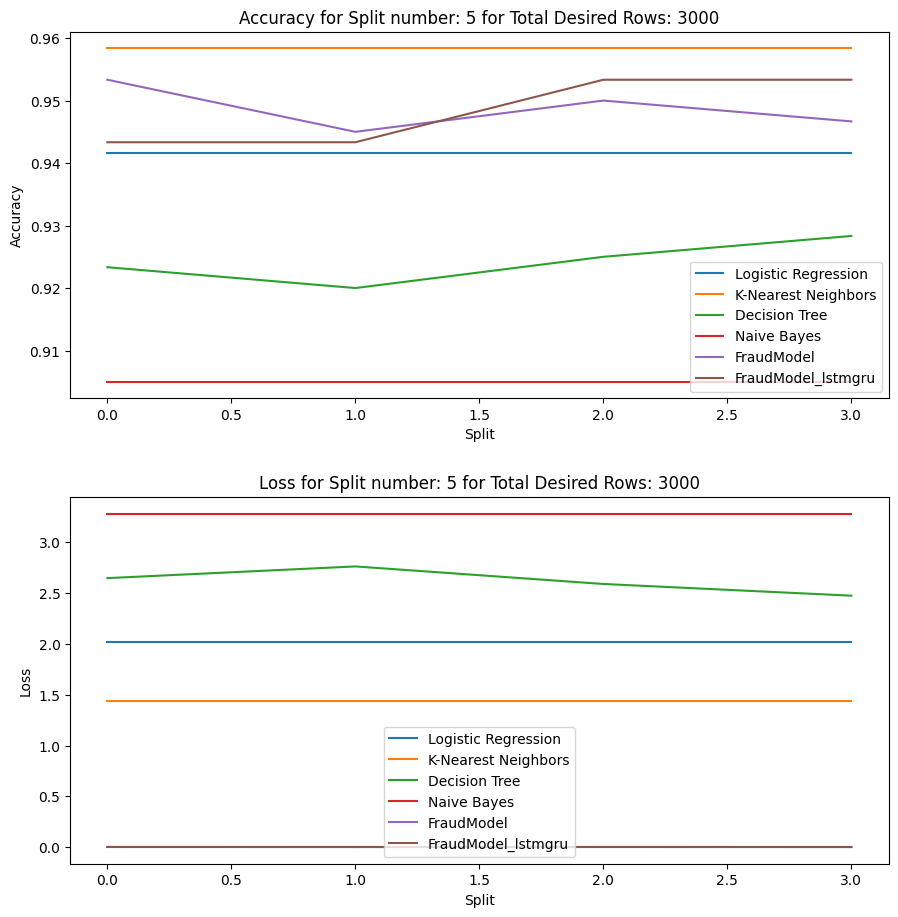

This is Split number: 1 for Total Desired Rows: 4000


Logistic Regression:
Accuracy: 0.9463, Precision: 0.9827, Recall: 0.9021, F1-score: 0.9407, ROC-AUC: 0.9439

K-Nearest Neighbors:
Accuracy: 0.9738, Precision: 0.9589, Recall: 0.9868, F1-score: 0.9726, ROC-AUC: 0.9744

Decision Tree:
Accuracy: 0.9525, Precision: 0.9404, Recall: 0.9603, F1-score: 0.9503, ROC-AUC: 0.9529

Naive Bayes:
Accuracy: 0.9087, Precision: 0.9525, Recall: 0.8492, F1-score: 0.8979, ROC-AUC: 0.9056


***************************************************************************

For the FraudModel:
Accuracy: 0.9563, Precision: 0.9648, Recall: 0.9418, F1-score: 0.9531, ROC-AUC: 0.9875


For the FraudModel_lstmgru:
Accuracy: 0.9587, Precision: 0.9832, Recall: 0.9286, F1-score: 0.9551, ROC-AUC: 0.9914

***************************************************************************

This is Split number: 2 for Total Desired Rows: 4000


Logistic Regression:
Accuracy: 0.9463, Precision: 0.9827, Recall: 0.9021, F1-score: 0.94

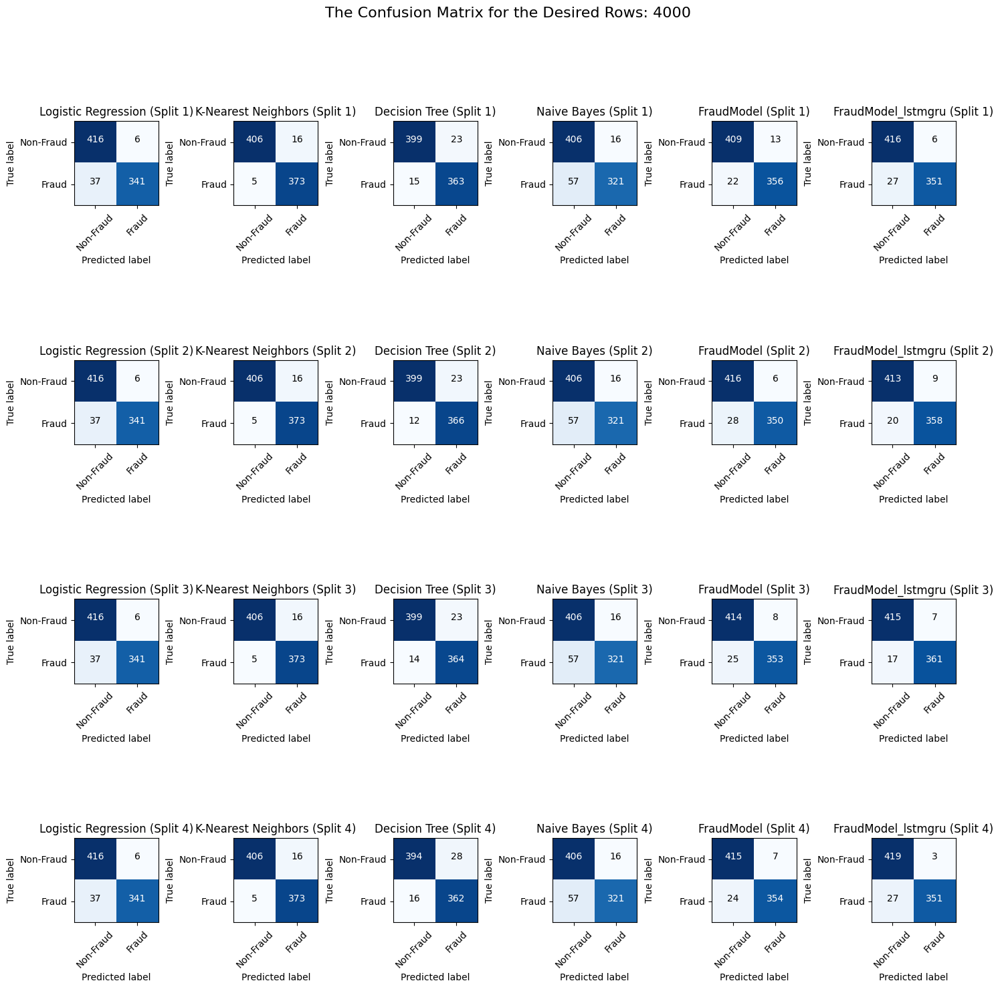

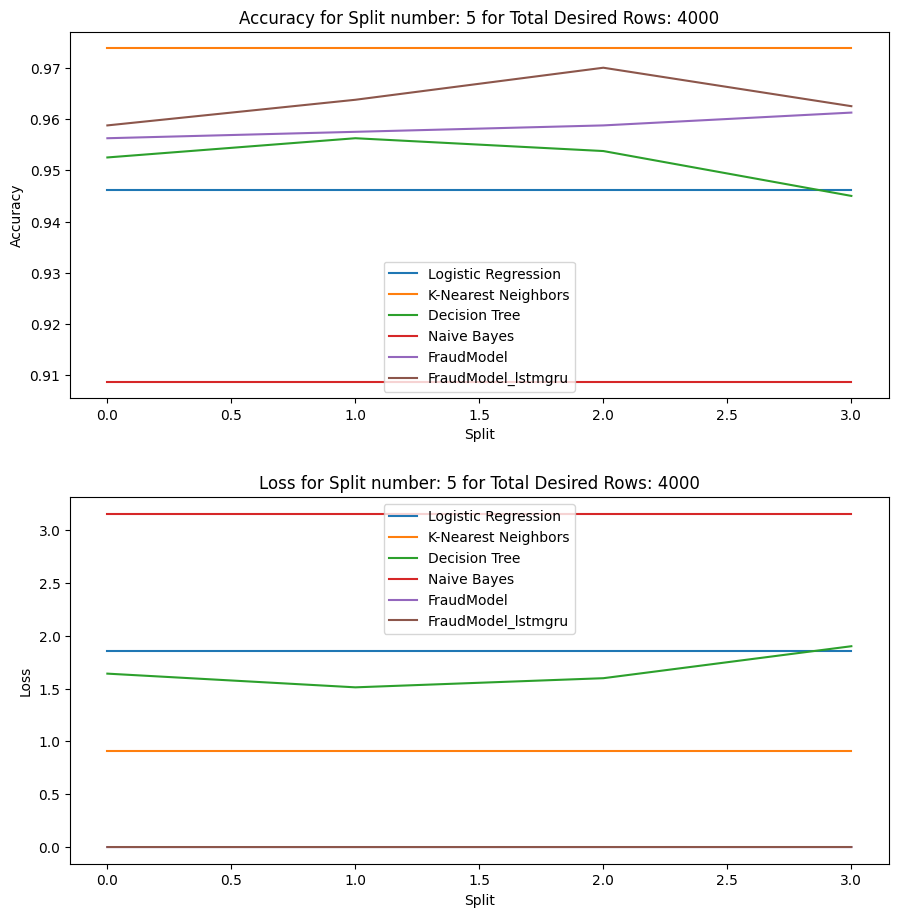

This is Split number: 1 for Total Desired Rows: 5000


Logistic Regression:
Accuracy: 0.9500, Precision: 0.9688, Recall: 0.9300, F1-score: 0.9490, ROC-AUC: 0.9500

K-Nearest Neighbors:
Accuracy: 0.9800, Precision: 0.9724, Recall: 0.9880, F1-score: 0.9802, ROC-AUC: 0.9800

Decision Tree:
Accuracy: 0.9630, Precision: 0.9566, Recall: 0.9700, F1-score: 0.9633, ROC-AUC: 0.9630

Naive Bayes:
Accuracy: 0.9150, Precision: 0.9642, Recall: 0.8620, F1-score: 0.9102, ROC-AUC: 0.9150


***************************************************************************

For the FraudModel:
Accuracy: 0.9740, Precision: 0.9759, Recall: 0.9720, F1-score: 0.9739, ROC-AUC: 0.9959


For the FraudModel_lstmgru:
Accuracy: 0.9740, Precision: 0.9740, Recall: 0.9740, F1-score: 0.9740, ROC-AUC: 0.9963

***************************************************************************

This is Split number: 2 for Total Desired Rows: 5000


Logistic Regression:
Accuracy: 0.9500, Precision: 0.9688, Recall: 0.9300, F1-score: 0.94

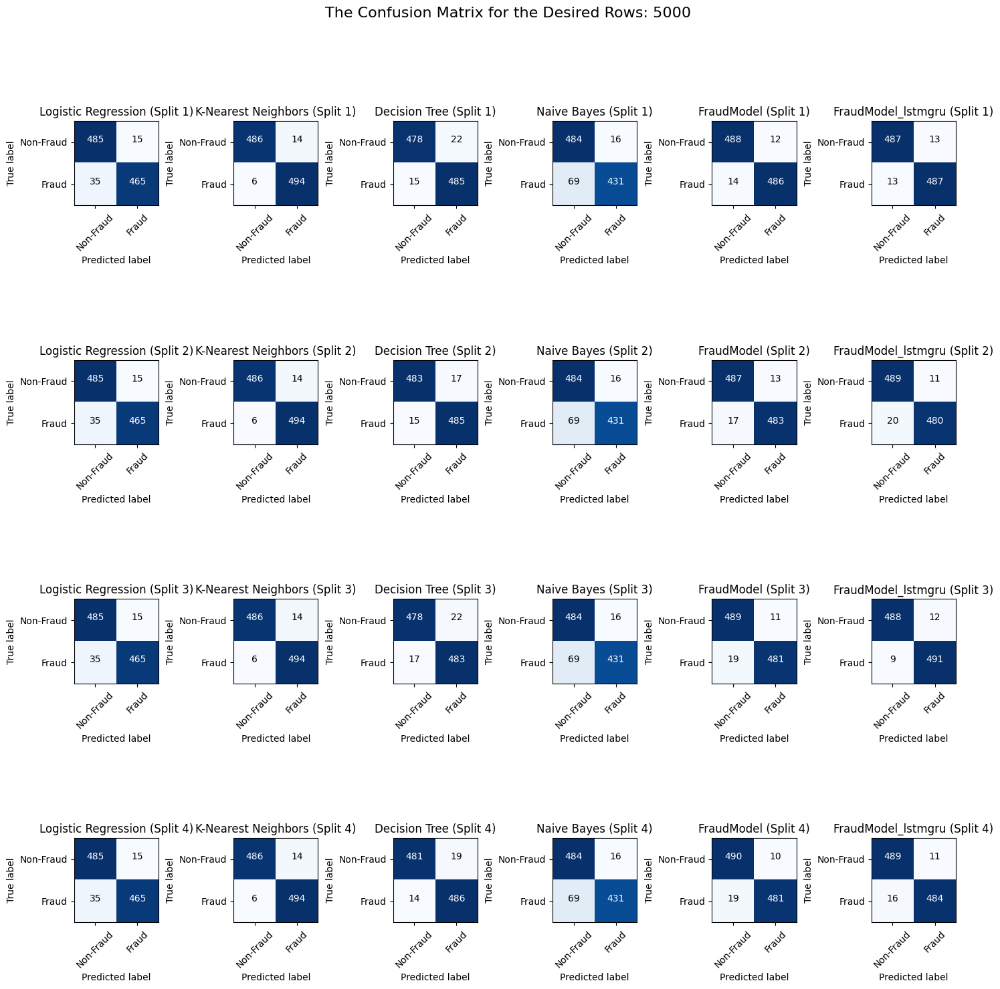

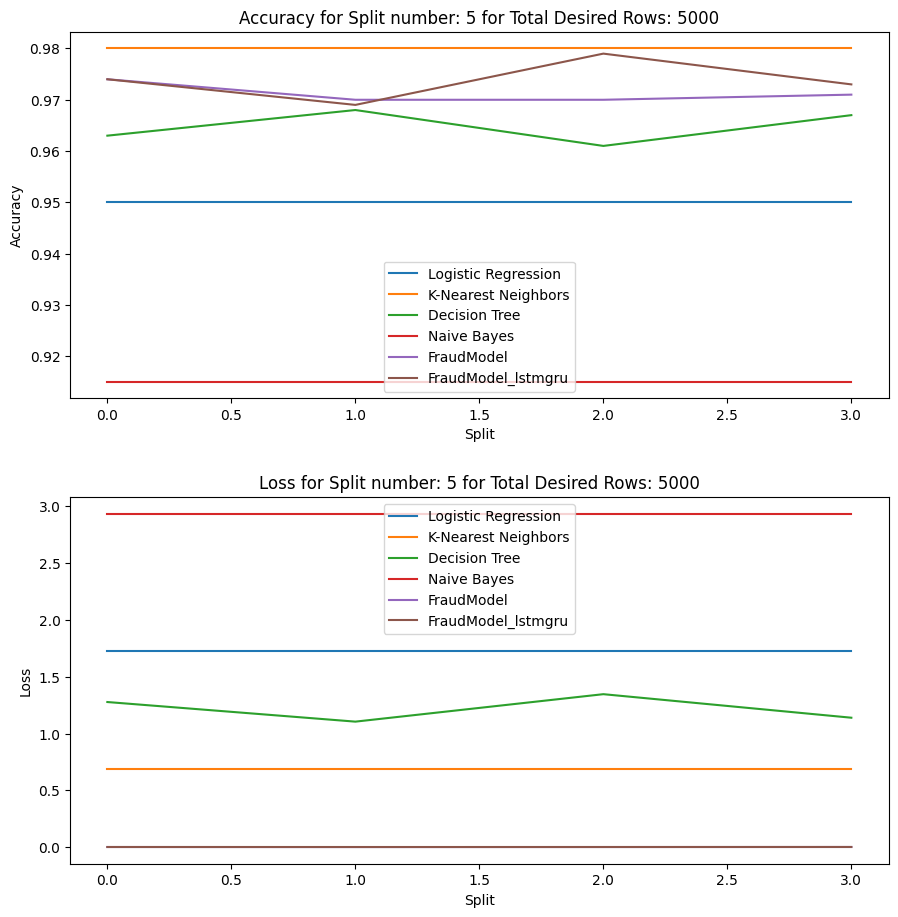

This is Split number: 1 for Total Desired Rows: 6000


Logistic Regression:
Accuracy: 0.9408, Precision: 0.9725, Recall: 0.9046, F1-score: 0.9373, ROC-AUC: 0.9401

K-Nearest Neighbors:
Accuracy: 0.9808, Precision: 0.9638, Recall: 0.9983, F1-score: 0.9808, ROC-AUC: 0.9812

Decision Tree:
Accuracy: 0.9675, Precision: 0.9597, Recall: 0.9744, F1-score: 0.9670, ROC-AUC: 0.9676

Naive Bayes:
Accuracy: 0.9067, Precision: 0.9666, Recall: 0.8382, F1-score: 0.8978, ROC-AUC: 0.9052


***************************************************************************

For the FraudModel:
Accuracy: 0.9758, Precision: 0.9810, Recall: 0.9693, F1-score: 0.9751, ROC-AUC: 0.9944


For the FraudModel_lstmgru:
Accuracy: 0.9667, Precision: 0.9841, Recall: 0.9472, F1-score: 0.9653, ROC-AUC: 0.9951

***************************************************************************

This is Split number: 2 for Total Desired Rows: 6000


Logistic Regression:
Accuracy: 0.9408, Precision: 0.9725, Recall: 0.9046, F1-score: 0.93

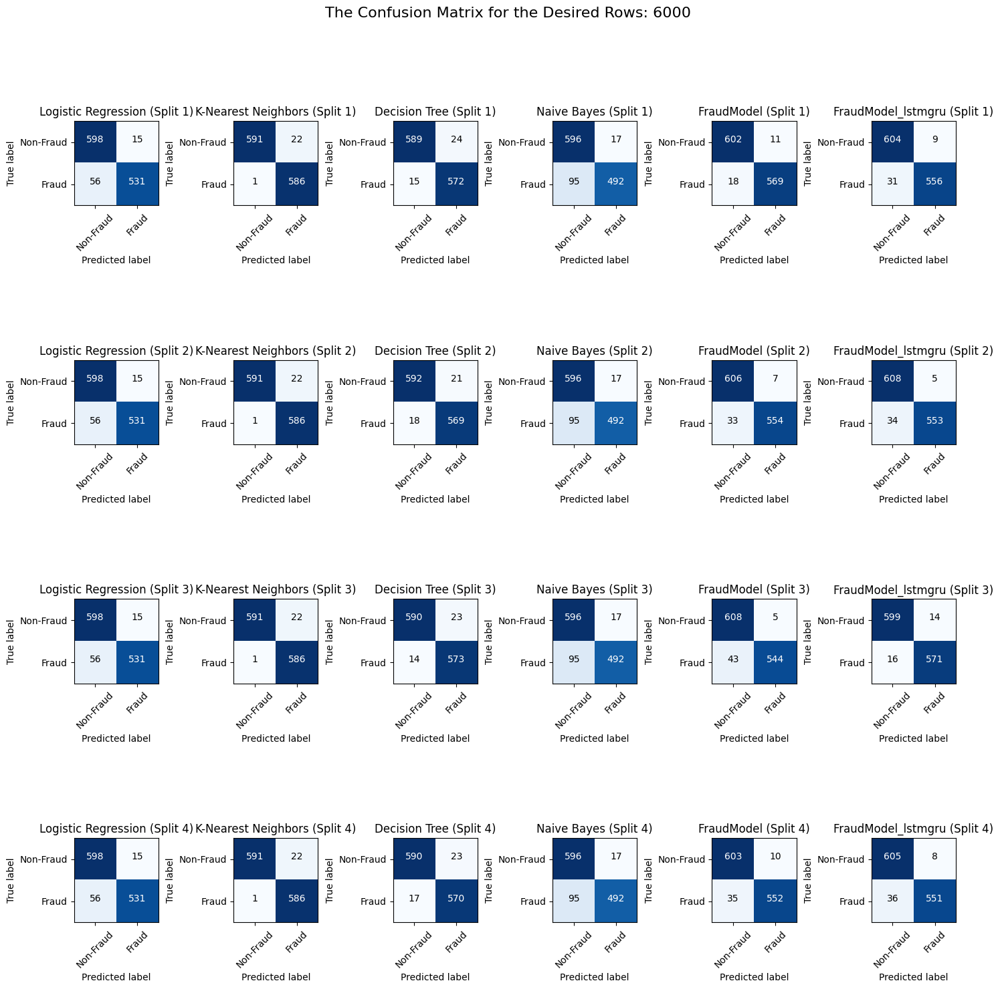

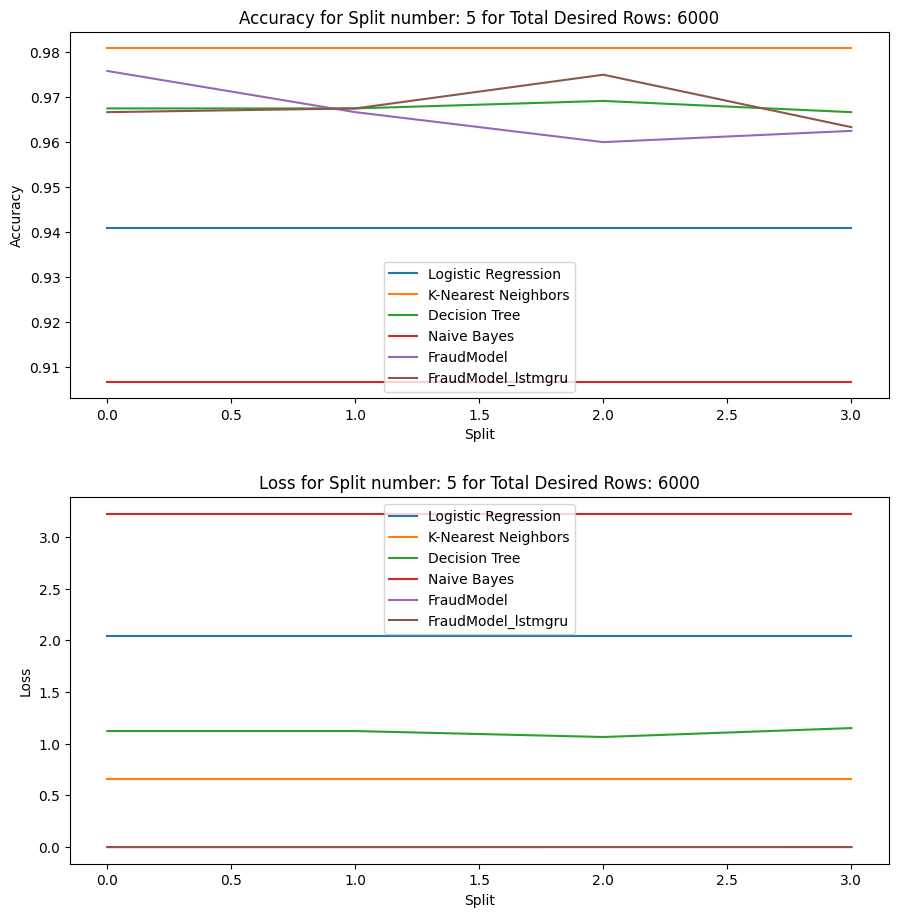

This is Split number: 1 for Total Desired Rows: 7000


Logistic Regression:
Accuracy: 0.9471, Precision: 0.9738, Recall: 0.9173, F1-score: 0.9447, ROC-AUC: 0.9467

K-Nearest Neighbors:
Accuracy: 0.9807, Precision: 0.9649, Recall: 0.9971, F1-score: 0.9807, ROC-AUC: 0.9810

Decision Tree:
Accuracy: 0.9600, Precision: 0.9502, Recall: 0.9695, F1-score: 0.9598, ROC-AUC: 0.9601

Naive Bayes:
Accuracy: 0.9136, Precision: 0.9625, Recall: 0.8578, F1-score: 0.9071, ROC-AUC: 0.9127


***************************************************************************

For the FraudModel:
Accuracy: 0.9736, Precision: 0.9866, Recall: 0.9594, F1-score: 0.9728, ROC-AUC: 0.9967


For the FraudModel_lstmgru:
Accuracy: 0.9621, Precision: 0.9938, Recall: 0.9289, F1-score: 0.9602, ROC-AUC: 0.9969

***************************************************************************

This is Split number: 2 for Total Desired Rows: 7000


Logistic Regression:
Accuracy: 0.9471, Precision: 0.9738, Recall: 0.9173, F1-score: 0.94

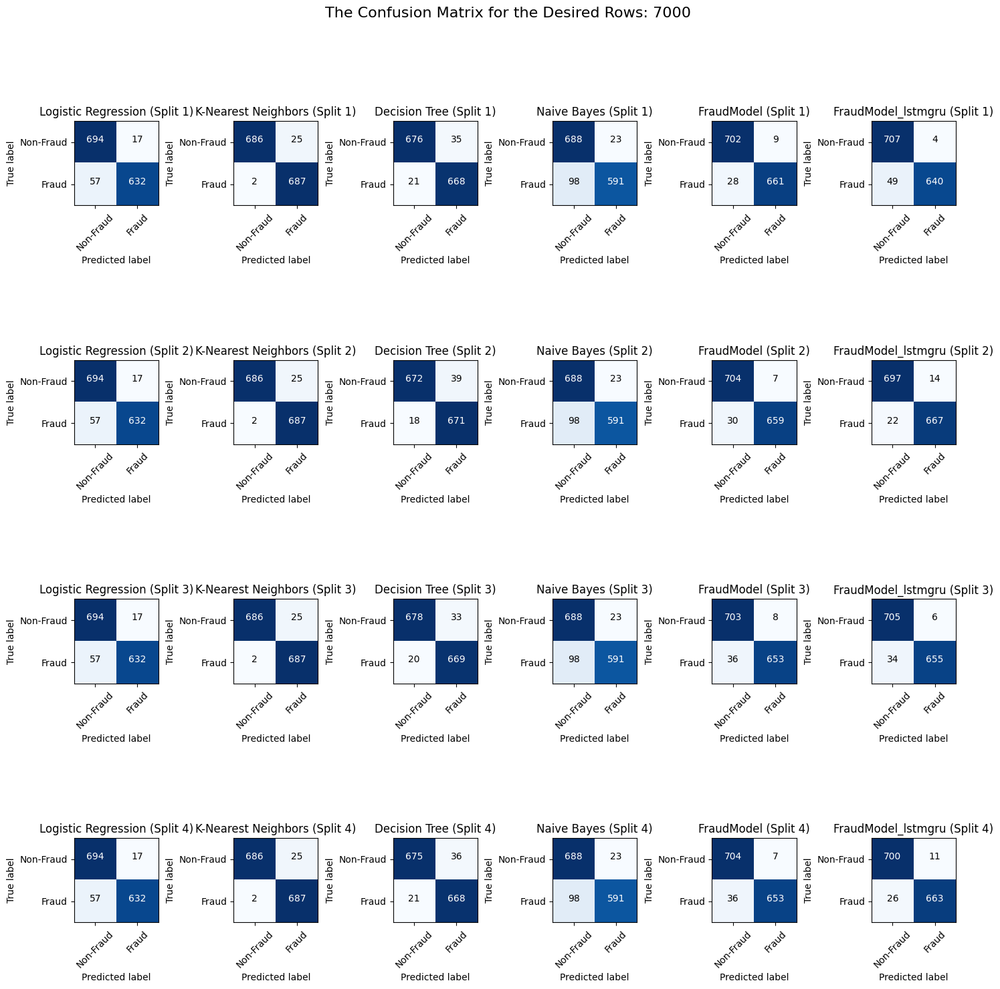

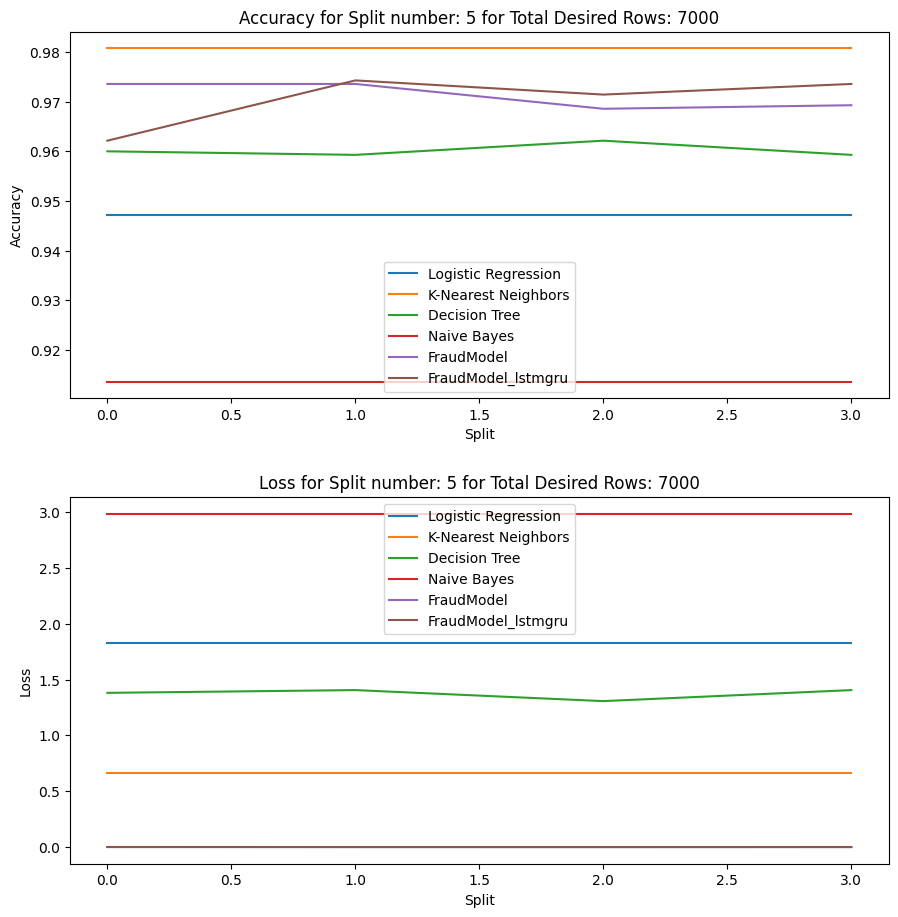

This is Split number: 1 for Total Desired Rows: 8000


Logistic Regression:
Accuracy: 0.9450, Precision: 0.9707, Recall: 0.9171, F1-score: 0.9432, ROC-AUC: 0.9449

K-Nearest Neighbors:
Accuracy: 0.9806, Precision: 0.9636, Recall: 0.9987, F1-score: 0.9809, ROC-AUC: 0.9807

Decision Tree:
Accuracy: 0.9537, Precision: 0.9501, Recall: 0.9573, F1-score: 0.9537, ROC-AUC: 0.9538

Naive Bayes:
Accuracy: 0.9081, Precision: 0.9669, Recall: 0.8442, F1-score: 0.9014, ROC-AUC: 0.9078


***************************************************************************

For the FraudModel:
Accuracy: 0.9719, Precision: 0.9908, Recall: 0.9523, F1-score: 0.9712, ROC-AUC: 0.9969


For the FraudModel_lstmgru:
Accuracy: 0.9800, Precision: 0.9823, Recall: 0.9774, F1-score: 0.9798, ROC-AUC: 0.9977

***************************************************************************

This is Split number: 2 for Total Desired Rows: 8000


Logistic Regression:
Accuracy: 0.9450, Precision: 0.9707, Recall: 0.9171, F1-score: 0.94

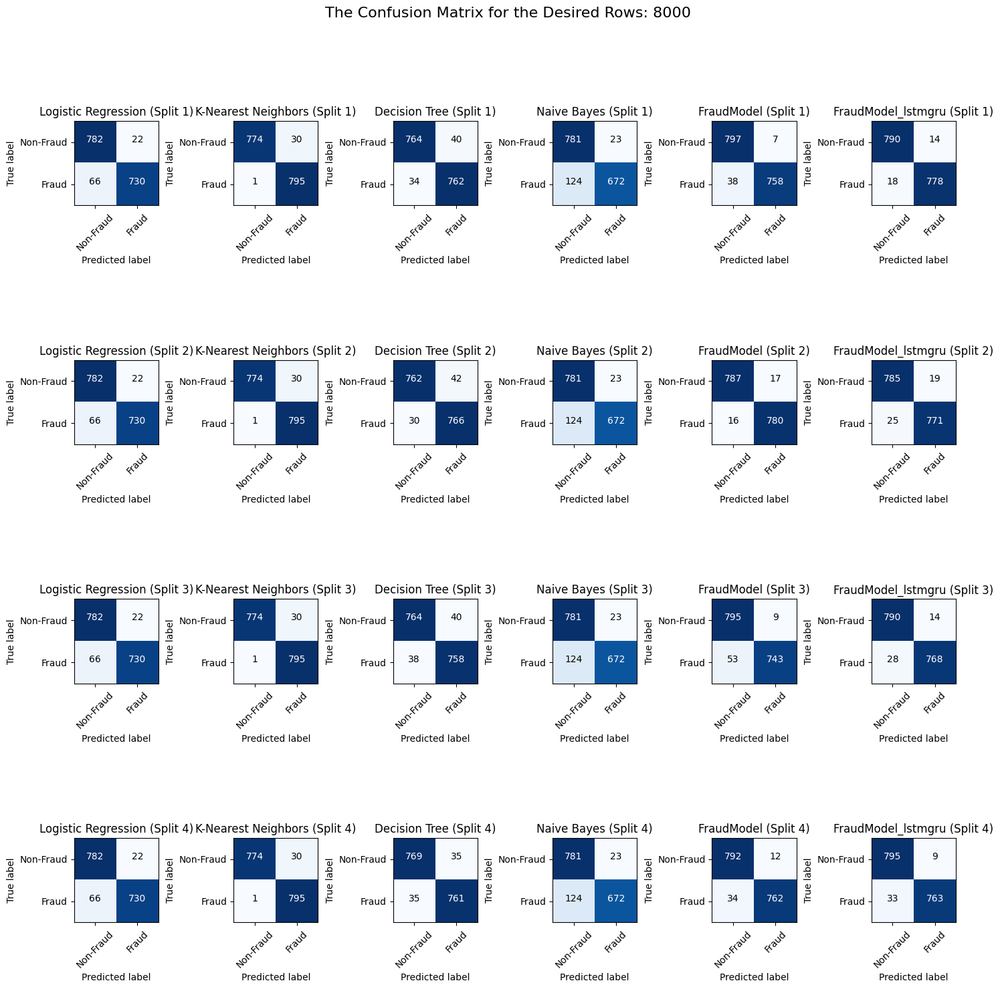

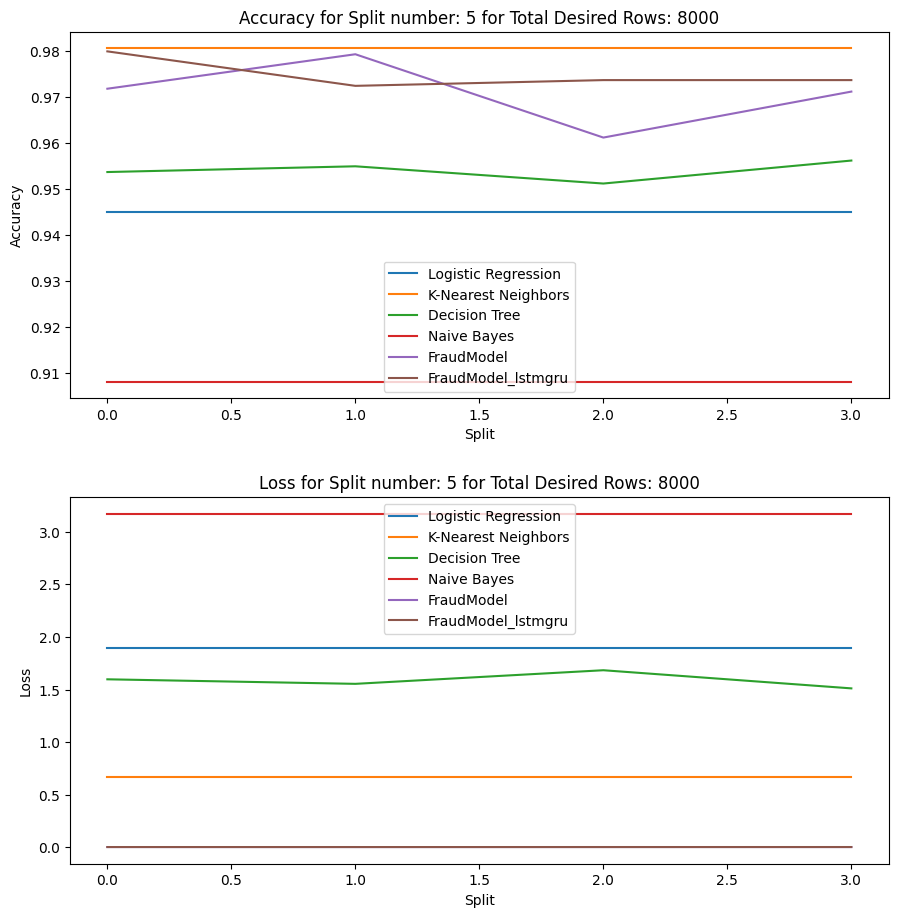

This is Split number: 1 for Total Desired Rows: 9000


Logistic Regression:
Accuracy: 0.9450, Precision: 0.9789, Recall: 0.9116, F1-score: 0.9440, ROC-AUC: 0.9456

K-Nearest Neighbors:
Accuracy: 0.9878, Precision: 0.9786, Recall: 0.9978, F1-score: 0.9881, ROC-AUC: 0.9876

Decision Tree:
Accuracy: 0.9667, Precision: 0.9672, Recall: 0.9672, F1-score: 0.9672, ROC-AUC: 0.9667

Naive Bayes:
Accuracy: 0.9044, Precision: 0.9662, Recall: 0.8417, F1-score: 0.8996, ROC-AUC: 0.9056


***************************************************************************

For the FraudModel:
Accuracy: 0.9728, Precision: 0.9898, Recall: 0.9563, F1-score: 0.9728, ROC-AUC: 0.9940


For the FraudModel_lstmgru:
Accuracy: 0.9756, Precision: 0.9834, Recall: 0.9683, F1-score: 0.9758, ROC-AUC: 0.9977

***************************************************************************

This is Split number: 2 for Total Desired Rows: 9000


Logistic Regression:
Accuracy: 0.9450, Precision: 0.9789, Recall: 0.9116, F1-score: 0.94

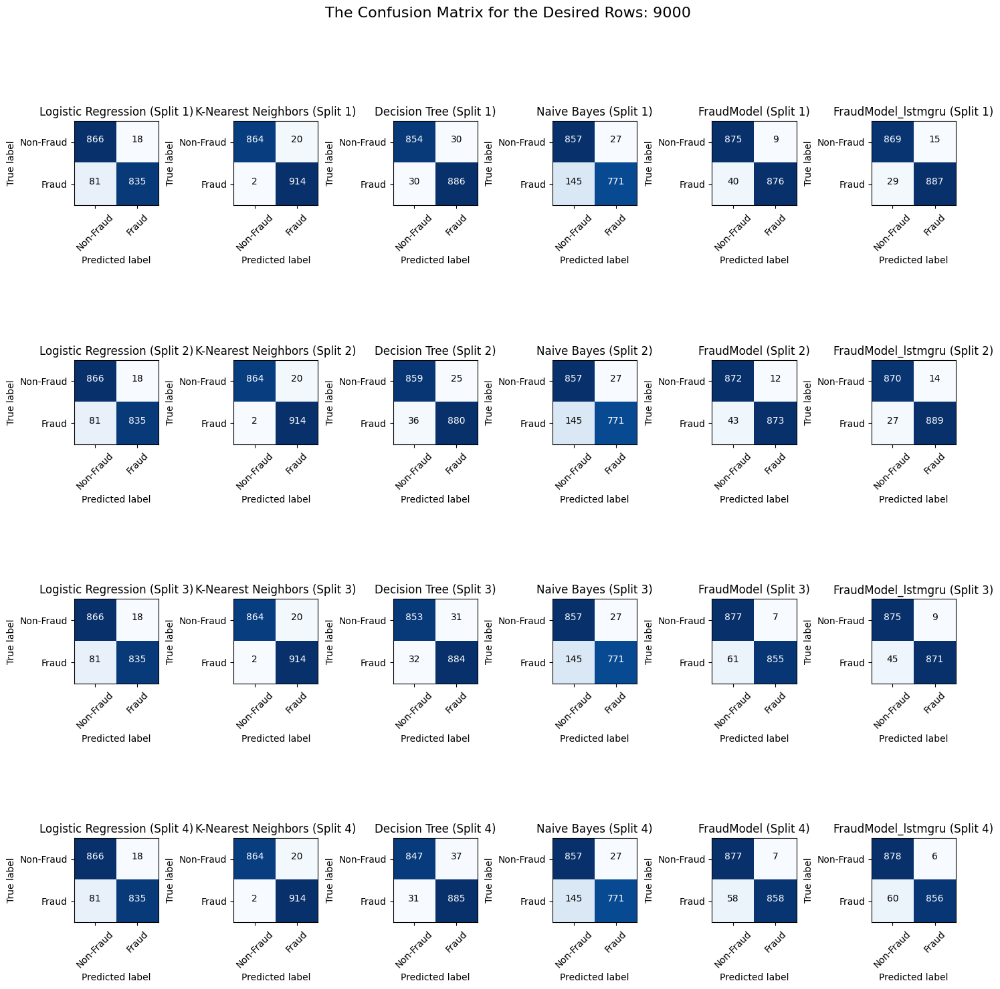

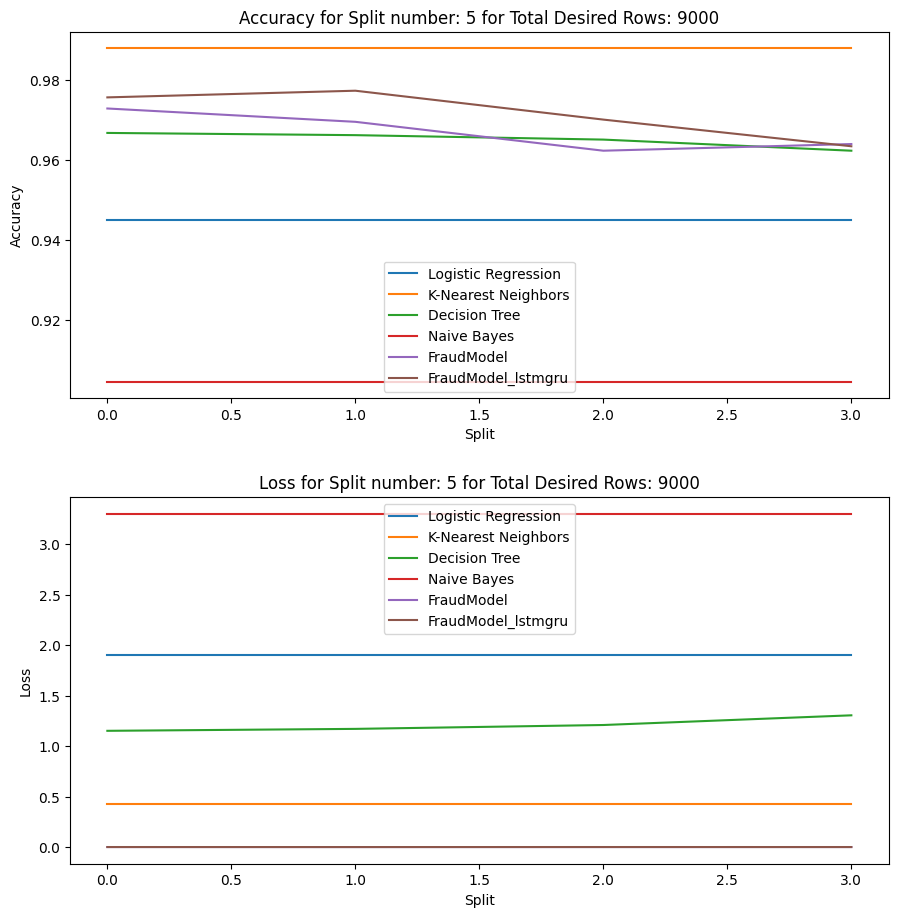

This is Split number: 1 for Total Desired Rows: 10000


Logistic Regression:
Accuracy: 0.9580, Precision: 0.9819, Recall: 0.9322, F1-score: 0.9564, ROC-AUC: 0.9577

K-Nearest Neighbors:
Accuracy: 0.9825, Precision: 0.9658, Recall: 1.0000, F1-score: 0.9826, ROC-AUC: 0.9827

Decision Tree:
Accuracy: 0.9705, Precision: 0.9640, Recall: 0.9767, F1-score: 0.9703, ROC-AUC: 0.9706

Naive Bayes:
Accuracy: 0.9240, Precision: 0.9729, Recall: 0.8704, F1-score: 0.9188, ROC-AUC: 0.9234


***************************************************************************

For the FraudModel:
Accuracy: 0.9845, Precision: 0.9858, Recall: 0.9828, F1-score: 0.9843, ROC-AUC: 0.9986


For the FraudModel_lstmgru:
Accuracy: 0.9825, Precision: 0.9928, Recall: 0.9717, F1-score: 0.9821, ROC-AUC: 0.9987

***************************************************************************

This is Split number: 2 for Total Desired Rows: 10000


Logistic Regression:
Accuracy: 0.9580, Precision: 0.9819, Recall: 0.9322, F1-score: 0.

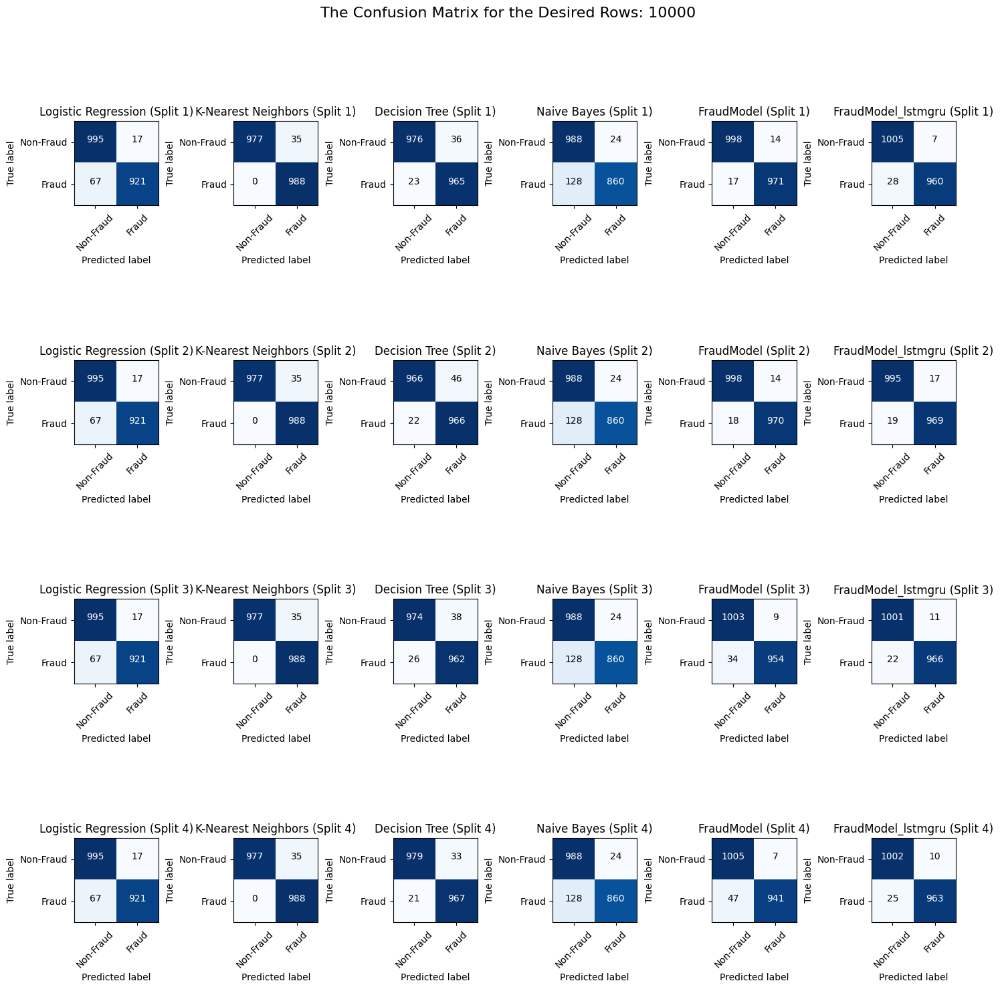

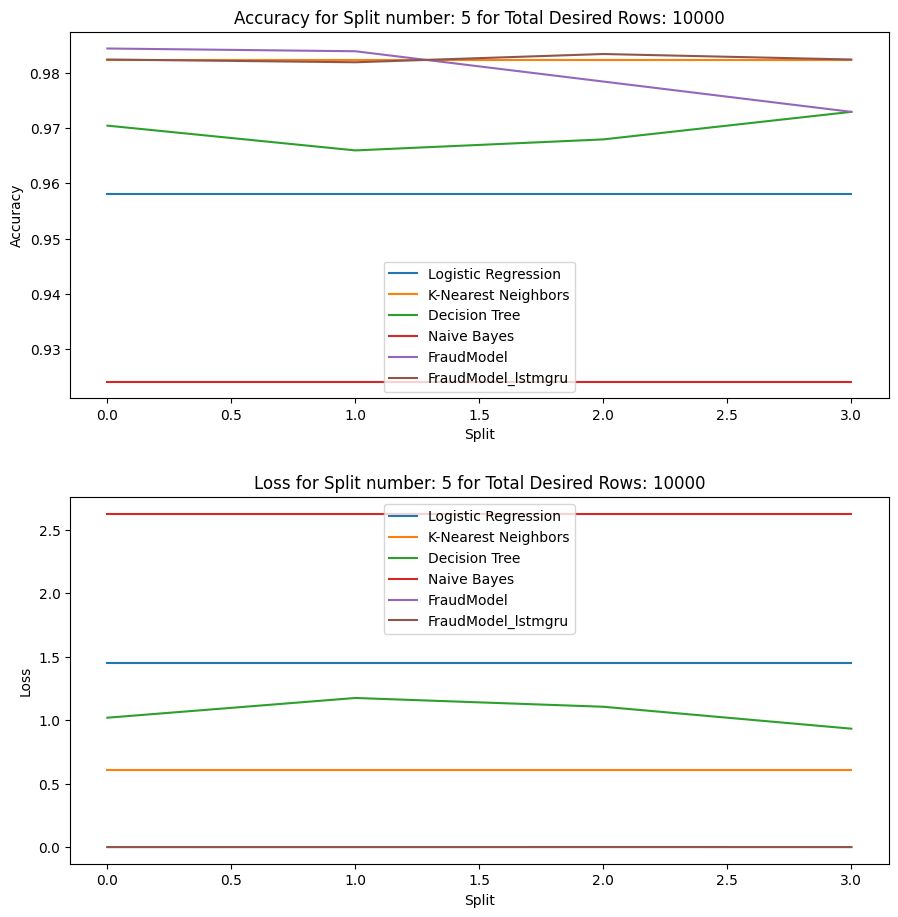

This is Split number: 1 for Total Desired Rows: 11000


Logistic Regression:
Accuracy: 0.9405, Precision: 0.9753, Recall: 0.9029, F1-score: 0.9377, ROC-AUC: 0.9402

K-Nearest Neighbors:
Accuracy: 0.9814, Precision: 0.9638, Recall: 1.0000, F1-score: 0.9816, ROC-AUC: 0.9815

Decision Tree:
Accuracy: 0.9659, Precision: 0.9635, Recall: 0.9679, F1-score: 0.9657, ROC-AUC: 0.9659

Naive Bayes:
Accuracy: 0.9068, Precision: 0.9664, Recall: 0.8416, F1-score: 0.8997, ROC-AUC: 0.9063


***************************************************************************

For the FraudModel:
Accuracy: 0.9768, Precision: 0.9780, Recall: 0.9753, F1-score: 0.9766, ROC-AUC: 0.9973


For the FraudModel_lstmgru:
Accuracy: 0.9777, Precision: 0.9806, Recall: 0.9744, F1-score: 0.9775, ROC-AUC: 0.9979

***************************************************************************

This is Split number: 2 for Total Desired Rows: 11000


Logistic Regression:
Accuracy: 0.9405, Precision: 0.9753, Recall: 0.9029, F1-score: 0.

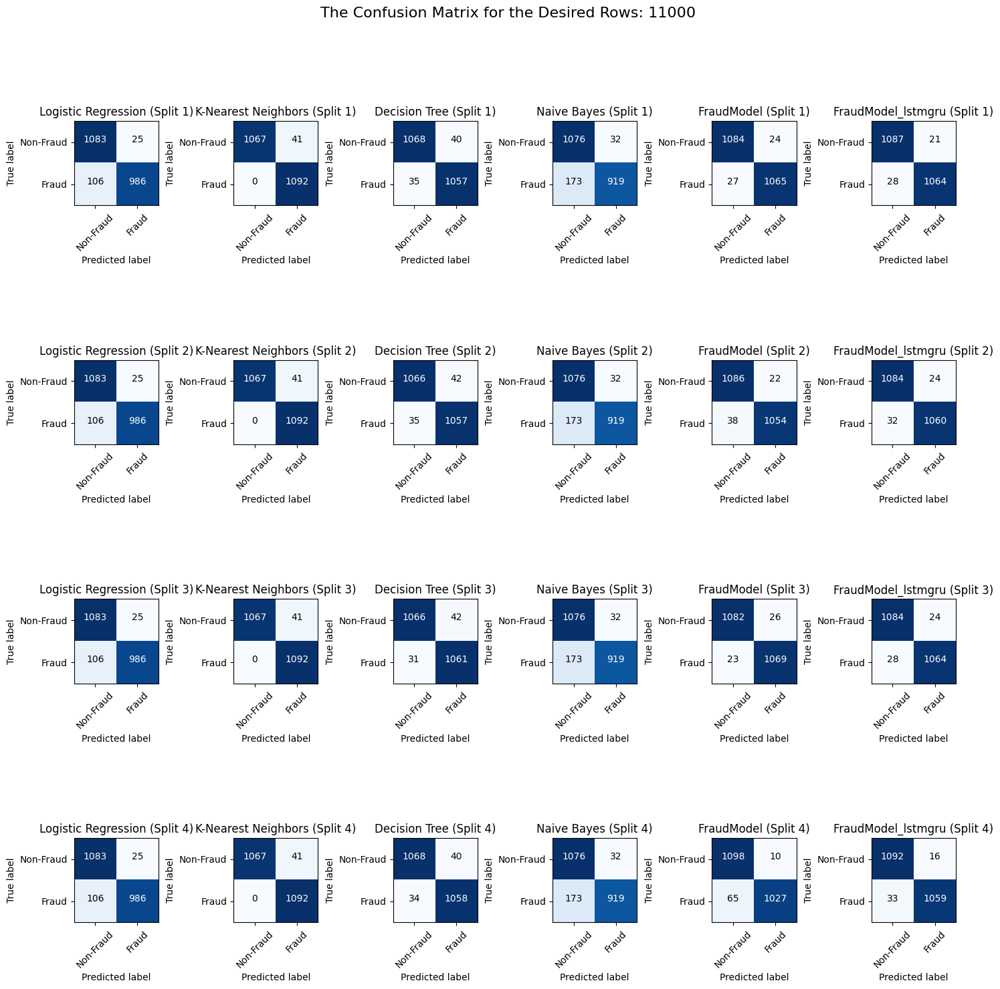

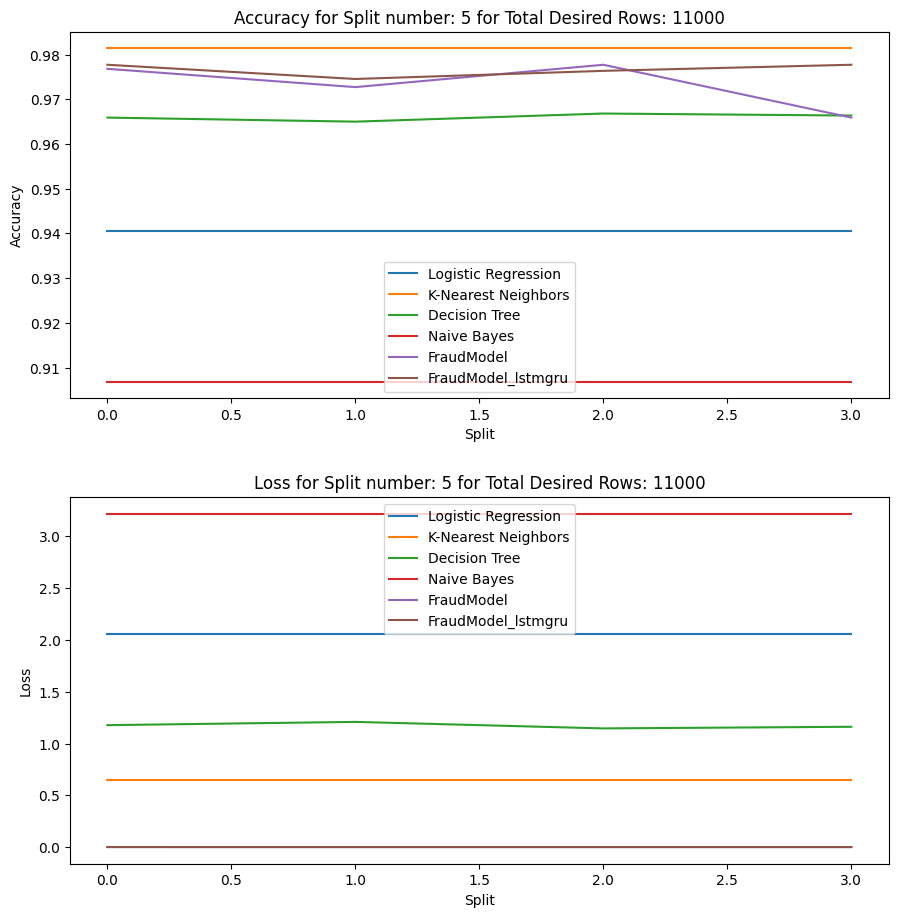

In [104]:
# Main program
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
skf = StratifiedKFold(n_splits=4)
criterion = nn.BCELoss()

for total_desired_rows in total_desired_rows_list:

    X_new = X_new_alldf[total_desired_rows]
    y_new = Y_new_alldf[total_desired_rows]
    
    metrics = {}

    for name in classifiers.keys():
        metrics[name] = {"accuracy": [], "loss": []}
    metrics["FraudModel"] = {"accuracy": [], "loss": []}
    metrics["FraudModel_lstmgru"] = {"accuracy": [], "loss": []}

    num_splits = 4
    num_classifiers = len(classifiers) + 2  # Add 1 for the CreditCardFraudModel and 1 for CreditCardFraudModel_lstmgru
    fig, axes = plt.subplots(num_splits, num_classifiers, figsize=(15, 15))
    fig.tight_layout(pad=5.0)
    fig.suptitle(f"The Confusion Matrix for the Desired Rows: {total_desired_rows}", fontsize=16, y=1.02)

    counter=1

    for train_index, test_index in skf.split(X_new, y_new):
        X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size=0.2, random_state=42)

        col_idx = 0

        print(f"This is Split number: {counter} for Total Desired Rows: {total_desired_rows}")

        print("\n===========================================================================\n")

        for name, clf in classifiers.items():
            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)
            accuracy = accuracy_score(y_test, y_pred)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            roc_auc = roc_auc_score(y_test, y_pred)
            loss = log_loss(y_test, y_pred)
            metrics[name]["accuracy"].append(accuracy)
            metrics[name]["loss"].append(loss)

            conf_mat = confusion_matrix(y_test, y_pred)
            plot_confusion_matrix(axes[counter - 1, col_idx], conf_mat, counter, name, total_desired_rows)
            col_idx += 1

            print(f"{name}:")
            print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, ROC-AUC: {roc_auc:.4f}\n")

        train_dataset = TensorDataset(torch.tensor(X_train, dtype=torch.float32), torch.tensor(y_train, dtype=torch.long))
        test_dataset = TensorDataset(torch.tensor(X_test, dtype=torch.float32), torch.tensor(y_test, dtype=torch.long))

        train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
        test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

        model = CreditCardFraudModel(X_train.shape[1]).to(device)
        optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-5)
        num_epochs = 15
        num_train_steps = num_epochs * len(train_loader)
        scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=int(0.1 * num_train_steps), num_training_steps=num_train_steps)

        precision, recall, f1, roc_auc, accuracy, conf_mat, running_loss_avg = train_and_evaluate(model, train_loader, test_loader, num_epochs, optimizer, scheduler, criterion, device)
        

        metrics["FraudModel"]["accuracy"].append(accuracy)
        running_loss_avg = running_loss_avg / len(train_loader)
        metrics["FraudModel"]["loss"].append(running_loss_avg)

        plot_confusion_matrix(axes[counter - 1, col_idx], conf_mat, counter, "FraudModel", total_desired_rows)
        
        print("\n***************************************************************************\n")
        print("For the FraudModel:")
        print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, ROC-AUC: {roc_auc:.4f}")
        print("\n===========================================================================\n")

        col_idx += 1

        model = CreditCardFraudModel_lstmgru(X_train.shape[1]).to(device)
        optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-5)
        num_epochs = 15
        num_train_steps = num_epochs * len(train_loader)
        scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=int(0.1 * num_train_steps), num_training_steps=num_train_steps)

        precision, recall, f1, roc_auc, accuracy, conf_mat, running_loss_avg = train_and_evaluate(model, train_loader, test_loader, num_epochs, optimizer, scheduler, criterion, device)
        

        metrics["FraudModel_lstmgru"]["accuracy"].append(accuracy)
        running_loss_avg = running_loss_avg / len(train_loader)
        metrics["FraudModel_lstmgru"]["loss"].append(running_loss_avg)

        plot_confusion_matrix(axes[counter - 1, col_idx], conf_mat, counter, "FraudModel_lstmgru", total_desired_rows)
        
        print("For the FraudModel_lstmgru:")
        print(f"Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-score: {f1:.4f}, ROC-AUC: {roc_auc:.4f}")
        print("\n***************************************************************************\n")
        
        counter+=1

    plt.show()

    fig, axes = plt.subplots(2, 1, figsize=(10, 10))
    fig.tight_layout(pad=5.0)

    # Plot accuracy
    for name, metric in metrics.items():
        axes[0].plot(metric["accuracy"], label=name)
    axes[0].set_title(f"Accuracy for Split number: {counter} for Total Desired Rows: {total_desired_rows}")
    axes[0].set_xlabel("Split")
    axes[0].set_ylabel("Accuracy")
    axes[0].legend()

    # Plot loss
    for name, metric in metrics.items():
        if metric["loss"]:
            axes[1].plot(metric["loss"], label=name)
    axes[1].set_title(f"Loss for Split number: {counter} for Total Desired Rows: {total_desired_rows}")
    axes[1].set_xlabel("Split")
    axes[1].set_ylabel("Loss")
    axes[1].legend()

    plt.show()
